<a href="https://colab.research.google.com/github/Emekus50/predictive-analytics/blob/main/Network_Security_1105.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import keras
import tensorflow as tf
import sklearn
import matplotlib.pyplot as plt
import math
import seaborn as sns

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Load data
merged_df = pd.read_csv('/content/drive/My Drive/merged_dataset.csv')

<ipython-input-3-ad73d13ddc66>:2: DtypeWarning: Columns (1,3,39,47) have mixed types. Specify dtype option on import or set low_memory=False.
  merged_df = pd.read_csv('/content/drive/My Drive/merged_dataset.csv')


# **Preprocessing**

In [4]:
# Replace NaNs in 'attack_cat' column with 'normal'
merged_df['attack_cat'].fillna('normal', inplace=True)

# Replace NaNs in 'ct_flw_http_mthd' and 'is_ftp_login' columns with '0'
merged_df['ct_flw_http_mthd'].fillna(0, inplace=True)
merged_df['is_ftp_login'].fillna(0, inplace=True)

# Handling replacements for 'dsport', 'service', and 'sport' as per the provided table
# Replacing special strings in 'dsport'
special_values_dsport = ['-', '0xc0a8', '0x20205321', '0xcc09']
for value in special_values_dsport:
    merged_df['dsport'].replace(value, '53', inplace=True)

# Replacing special strings in 'service'
merged_df['service'].replace('-', 'unknown', inplace=True)

# Replacing special strings in 'sport'
special_values_sport = ['-', '0x000b', '0x000c']
for value in special_values_sport:
    merged_df['sport'].replace(value, '1043', inplace=True)


# Replace empty strings, None, or whitespace-only strings with 0
merged_df['ct_ftp_cmd'] = merged_df['ct_ftp_cmd'].apply(lambda x: 0 if pd.isna(x) or str(x).strip() == '' else x)

# Convert the 'dsport' column from string to numeric (integers)
merged_df['dsport'] = pd.to_numeric(merged_df['dsport'])
# Convert the 'sport' column from string to numeric (integers)
merged_df['sport'] = pd.to_numeric(merged_df['sport'])

In [5]:
merged_df.to_csv('/content/drive/My Drive/just_clean1005')

In [5]:
import pandas as pd

# Assuming 'merged_df' is your DataFrame and has been loaded
categorical_columns = ['proto', 'service', 'attack_cat', 'state', 'ct_ftp_cmd']

# Apply one-hot encoding to the specified categorical columns
merged_df_encoded = pd.get_dummies(merged_df, columns=categorical_columns, dtype=int)  # Ensure dtype is int

# Now print the head to confirm the encoding and data types
print(merged_df_encoded.head())
print(merged_df_encoded.dtypes)


        srcip  sport          dstip  dsport       dur  sbytes  dbytes  sttl  \
0  59.166.0.0   1390  149.171.126.6      53  0.001055     132     164    31   
1  59.166.0.0  33661  149.171.126.9    1024  0.036133     528     304    31   
2  59.166.0.6   1464  149.171.126.7      53  0.001119     146     178    31   
3  59.166.0.5   3593  149.171.126.5      53  0.001209     132     164    31   
4  59.166.0.3  49664  149.171.126.0      53  0.001169     146     178    31   

   dttl  sloss  ...  ct_ftp_cmd_2  ct_ftp_cmd_3  ct_ftp_cmd_4  ct_ftp_cmd_5  \
0    29      0  ...             0             0             0             0   
1    29      0  ...             0             0             0             0   
2    29      0  ...             0             0             0             0   
3    29      0  ...             0             0             0             0   
4    29      0  ...             0             0             0             0   

   ct_ftp_cmd_6  ct_ftp_cmd_8  ct_ftp_cmd_0  ct_ft

In [6]:
# Frequency encoding for IP addresses
freq_srcip = merged_df_encoded['srcip'].value_counts(normalize=True)  # Frequency of each IP in 'srcip'
merged_df_encoded['srcip'] = merged_df_encoded['srcip'].map(freq_srcip)  # Map frequencies back to the DataFrame

freq_dstip = merged_df_encoded['dstip'].value_counts(normalize=True)
merged_df_encoded['dstip'] = merged_df_encoded['dstip'].map(freq_dstip)

In [7]:
merged_df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2540047 entries, 0 to 2540046
Columns: 234 entries, srcip to ct_ftp_cmd_4
dtypes: float64(14), int64(220)
memory usage: 4.4 GB


In [8]:
# Print the list of all column names in merged_df_encoded
print("Columns in merged_df_encoded:")
print(merged_df_encoded.columns.tolist())


Columns in merged_df_encoded:
['srcip', 'sport', 'dstip', 'dsport', 'dur', 'sbytes', 'dbytes', 'sttl', 'dttl', 'sloss', 'dloss', 'Sload', 'Dload', 'Spkts', 'Dpkts', 'swin', 'dwin', 'stcpb', 'dtcpb', 'smeansz', 'dmeansz', 'trans_depth', 'res_bdy_len', 'Sjit', 'Djit', 'Stime', 'Ltime', 'Sintpkt', 'Dintpkt', 'tcprtt', 'synack', 'ackdat', 'is_sm_ips_ports', 'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login', 'ct_srv_src', 'ct_srv_dst', 'ct_dst_ltm', 'ct_src_ ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'Label', 'proto_3pc', 'proto_a/n', 'proto_aes-sp3-d', 'proto_any', 'proto_argus', 'proto_aris', 'proto_arp', 'proto_ax.25', 'proto_bbn-rcc', 'proto_bna', 'proto_br-sat-mon', 'proto_cbt', 'proto_cftp', 'proto_chaos', 'proto_compaq-peer', 'proto_cphb', 'proto_cpnx', 'proto_crtp', 'proto_crudp', 'proto_dcn', 'proto_ddp', 'proto_ddx', 'proto_dgp', 'proto_egp', 'proto_eigrp', 'proto_emcon', 'proto_encap', 'proto_esp', 'proto_etherip', 'proto_fc', 'proto_fire', 'proto_ggp', 'pro

In [9]:
merged_df_encoded['proto_aris'].unique()

array([0, 1])

In [10]:
merged_df_encoded.shape

(2540047, 234)

In [11]:
# Check data types
print(merged_df_encoded.dtypes)


srcip           float64
sport             int64
dstip           float64
dsport            int64
dur             float64
                 ...   
ct_ftp_cmd_8      int64
ct_ftp_cmd_0      int64
ct_ftp_cmd_1      int64
ct_ftp_cmd_2      int64
ct_ftp_cmd_4      int64
Length: 234, dtype: object


In [12]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardizing the data: PCA works best with a normalized feature set.
scaler = StandardScaler()
data_scaled = scaler.fit_transform(merged_df_encoded)

# PCA
pca = PCA(n_components=0.95)  # keep 95% of variance
reduced_df = pca.fit_transform(data_scaled)

print(f"Reduced dataset shape: {reduced_df.shape}")
print(f"Explained variance ratio: {pca.explained_variance_ratio_.sum()}")


Reduced dataset shape: (2540047, 183)
Explained variance ratio: 0.950288100582574


In [13]:
import pandas as pd

# Assume reduced_df is your NumPy array from PCA
# Convert the NumPy array to a DataFrame
component_names = [f"PC{i+1}" for i in range(reduced_df.shape[1])]  # Naming principal components
reduced_df_dataframe = pd.DataFrame(reduced_df, columns=component_names)

# Print the DataFrame to verify it looks correct
print(reduced_df_dataframe.head())


        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -0.929598 -3.991348  0.351719  0.683775  1.602295  0.602843 -0.275679   
1 -0.150979 -3.675735  0.548871  0.837602  1.139547  0.189724 -0.708411   
2 -1.136037 -3.861963  0.207169  0.644370  1.489411  0.574603 -0.245122   
3 -0.947454 -3.990952  0.298490  0.675552  1.570399  0.619117 -0.282718   
4 -0.847499 -4.032249  0.281551  0.657509  1.533707  0.846456 -0.285086   

        PC8       PC9      PC10  ...     PC174     PC175     PC176     PC177  \
0 -0.007158 -0.140204 -0.183639  ...  0.040061  0.006584  0.004127 -0.017690   
1 -0.000130 -0.317762 -0.150356  ...  0.018367  0.025555  0.008052 -0.028211   
2  0.093292 -0.202174 -0.182165  ...  0.036298  0.006821  0.004116 -0.022864   
3  0.012994 -0.168849 -0.193339  ...  0.039649  0.008387  0.005532 -0.019047   
4  0.187289 -0.291141 -0.253879  ...  0.013944  0.016219  0.003291 -0.029755   

      PC178     PC179     PC180     PC181     PC182     PC183  
0  0

In [14]:
# Check if 'Label' exists in the original DataFrame
if 'Label' in merged_df.columns:
    # Add 'Label' back to the PCA DataFrame
    reduced_df_dataframe['Label'] = merged_df['Label'].values
    print("Label column added successfully.")
else:
    print("Label column does not exist in the original DataFrame.")


Label column added successfully.


In [15]:
# Display the first few rows of the DataFrame to confirm 'Label' has been added
print(reduced_df_dataframe.head())


        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -0.929598 -3.991348  0.351719  0.683775  1.602295  0.602843 -0.275679   
1 -0.150979 -3.675735  0.548871  0.837602  1.139547  0.189724 -0.708411   
2 -1.136037 -3.861963  0.207169  0.644370  1.489411  0.574603 -0.245122   
3 -0.947454 -3.990952  0.298490  0.675552  1.570399  0.619117 -0.282718   
4 -0.847499 -4.032249  0.281551  0.657509  1.533707  0.846456 -0.285086   

        PC8       PC9      PC10  ...     PC175     PC176     PC177     PC178  \
0 -0.007158 -0.140204 -0.183639  ...  0.006584  0.004127 -0.017690  0.080876   
1 -0.000130 -0.317762 -0.150356  ...  0.025555  0.008052 -0.028211 -0.057107   
2  0.093292 -0.202174 -0.182165  ...  0.006821  0.004116 -0.022864  0.081996   
3  0.012994 -0.168849 -0.193339  ...  0.008387  0.005532 -0.019047  0.077025   
4  0.187289 -0.291141 -0.253879  ...  0.016219  0.003291 -0.029755 -0.059319   

      PC179     PC180     PC181     PC182     PC183  Label  
0  0.02

In [16]:
reduced_df_dataframe.to_csv('/content/drive/My Drive/reduced_df.csv')

# **AT this Point, Work with this for the models and comp**

# **Random Forest**

In [17]:
from sklearn.model_selection import train_test_split
X = reduced_df_dataframe.drop('Label', axis=1)  # Features
y = reduced_df_dataframe['Label']  # Target variable

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [18]:
from sklearn.ensemble import RandomForestClassifier

# Initialize the model
model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [19]:
from sklearn.metrics import accuracy_score, classification_report

# Predict on the testing set
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")
print(classification_report(y_test, y_pred))


Accuracy: 0.9999980315348123
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    443831
           1       1.00      1.00      1.00     64179

    accuracy                           1.00    508010
   macro avg       1.00      1.00      1.00    508010
weighted avg       1.00      1.00      1.00    508010



# **Balancing the Data and creating 4 samples**

In [22]:
pip install imbalanced-learn scikit-learn pandas



SyntaxError: invalid syntax (<ipython-input-22-262c05be1717>, line 1)

In [23]:
import pandas as pd
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

In [24]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

# Assuming X and y are already defined, where 'X' are the features and 'y' is the target from reduced_df_dataframe
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X, y)

print(f"Resampled dataset shape {X_res.shape}")


Resampled dataset shape (4437528, 183)


In [25]:
# Combine X_res and y_res back into a DataFrame for easy handling
balanced_df = pd.DataFrame(X_res, columns=X.columns)
balanced_df['Label'] = y_res

# Randomly shuffle the dataset (optional but recommended)
balanced_df = balanced_df.sample(frac=1, random_state=42).reset_index(drop=True)

# Split the data into 4 equal parts
split_1, split_2, split_3, split_4 = np.array_split(balanced_df, 4)

print("Data split into four parts, each part has the following number of samples:")
print(len(split_1), len(split_2), len(split_3), len(split_4))


<ipython-input-25-6528184cac3b>:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  balanced_df['Label'] = y_res


Data split into four parts, each part has the following number of samples:
1109382 1109382 1109382 1109382


In [26]:
split_1

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC175,PC176,PC177,PC178,PC179,PC180,PC181,PC182,PC183,Label
0,3.070823,1.166203,-0.579284,-0.002965,-1.582104,-0.644941,-0.645067,-0.300963,-0.581748,0.128197,...,0.015554,0.011863,0.034572,0.079124,0.009532,0.019137,-0.047484,-0.172574,-0.215985,0
1,-6.077649,-0.155785,-1.494755,-0.556415,-0.342437,0.110076,1.100334,1.800405,-0.169360,0.408653,...,-0.097007,-0.100039,-0.088570,-0.144489,-0.035600,-0.100846,0.363063,0.047132,-0.037479,0
2,3.127236,1.548993,0.221808,0.180100,0.174629,1.766006,4.310601,-1.380139,1.079368,0.140230,...,-0.037569,-0.005211,0.052016,0.109690,0.117223,0.156747,0.047706,-0.215624,-0.142042,0
3,-8.682953,2.660898,-0.251037,-0.189978,-0.302131,0.016420,-0.443663,-1.374413,0.283450,-0.343373,...,0.052375,0.092214,0.095272,0.213169,0.029181,0.065241,-0.253984,-0.089886,-0.066045,1
4,3.412248,0.505768,-0.613545,0.001087,-1.600361,-0.715257,-0.715940,-0.399778,-0.801475,-0.157702,...,0.007433,0.044669,0.014295,0.045894,0.014499,-0.001548,0.109689,0.049432,0.194210,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1109377,-6.582273,0.122268,-2.205722,-0.810492,-0.768040,-0.003302,1.161084,1.846992,-0.367238,0.314196,...,-0.075366,-0.068756,-0.071666,0.044575,-0.004609,-0.111404,0.000509,-0.045749,-0.078196,0
1109378,2.580969,1.174900,0.228660,0.328744,0.490095,1.728319,4.222454,-1.384082,1.067948,0.174734,...,-0.038163,-0.004195,0.034919,0.107513,0.110412,0.140808,-0.003566,-0.232518,-0.165341,0
1109379,3.407571,5.038451,-6.839523,1.729225,4.819722,-0.638573,-1.849066,0.785299,-2.203321,-0.037021,...,-0.029056,-0.008085,-0.024943,-0.099471,-0.048263,0.063926,-0.534105,0.242065,0.008537,0
1109380,-7.800176,2.194899,0.607341,0.184945,0.220307,-0.097757,-0.669688,-1.749039,0.525250,-0.270827,...,0.042587,0.084300,0.083965,0.186100,0.017166,0.031190,-0.153593,-0.127317,-0.117136,1


In [27]:
split_2

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC175,PC176,PC177,PC178,PC179,PC180,PC181,PC182,PC183,Label
1109382,3.142647,0.777941,0.208185,0.388220,0.565726,1.506905,4.204405,-1.567293,1.063651,-0.047308,...,-0.046742,0.007154,0.008504,0.145913,0.128810,0.016117,-0.015545,-0.071009,0.187475,0
1109383,-9.574782,3.169587,-1.006414,-0.549870,-0.795399,0.065726,-0.182972,-0.942273,0.041939,-0.381904,...,0.059901,0.093155,0.099318,0.215427,0.037557,0.081054,-0.313393,-0.039486,-0.002940,1
1109384,-10.356523,3.532396,-1.838445,-0.919105,-1.256039,0.170031,0.101828,-0.529804,-0.156709,-0.428987,...,0.055591,0.091502,0.109950,0.244173,0.045965,0.108917,-0.405835,-0.014632,0.027568,1
1109385,-9.465622,3.110831,-1.004894,-0.565452,-0.814041,0.285879,-0.180111,-0.770709,-0.086196,-0.438439,...,0.065737,0.089681,0.087260,0.076245,0.017922,0.181865,-0.138351,0.080997,0.055617,1
1109386,-4.477374,2.262442,4.669427,2.162679,1.490715,-2.215627,-3.733378,-6.552804,2.966555,0.537851,...,-4.348776,-2.779865,2.122951,-1.120544,-1.236594,6.835115,1.605199,0.145598,0.033241,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2218759,-7.570468,2.039309,0.512723,0.134382,0.168478,0.240757,-0.722952,-1.660537,0.413880,-0.372034,...,0.060251,0.088884,0.086476,0.054662,0.003746,0.153510,-0.025296,-0.005342,-0.041202,1
2218760,-6.698160,1.565886,1.166454,0.438893,0.576604,0.217360,-0.982243,-2.054967,0.587652,-0.367213,...,0.064493,0.094044,0.084208,0.048861,-0.001782,0.156114,-0.000809,-0.038069,-0.083056,1
2218761,-6.421665,1.406654,1.492504,0.682422,0.743230,-0.108126,-1.229761,-2.424055,0.732357,-0.279663,...,0.064854,0.105323,0.075447,0.160862,0.018598,0.025617,-0.087341,-0.160594,-0.107630,1
2218762,0.143051,4.546169,6.590953,1.391593,0.670902,1.002393,-0.980560,2.873306,5.052048,0.152235,...,0.255212,0.130602,-0.035837,0.017572,-0.059276,-0.459339,0.179775,-0.072383,-0.067407,1


In [28]:
# Save each part to a CSV file
split_1.to_csv('/content/drive/My Drive/sample_1.csv', index=False)
split_2.to_csv('/content/drive/My Drive/sample_2.csv', index=False)
split_3.to_csv('/content/drive/My Drive/sample_3.csv', index=False)
split_4.to_csv('/content/drive/My Drive/sample_4.csv', index=False)

print("All parts saved as CSV files.")


All parts saved as CSV files.


**let these for now**

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

# Initialize the GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='accuracy')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

# Predict on the testing set using the best model
y_best_pred = best_model.predict(X_test)

# Evaluate the best model
print(f"Best Model Accuracy: {accuracy_score(y_test, y_best_pred)}")


# **Naive Bayes**

In [29]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report

# Prepare data
X = reduced_df_dataframe.drop('Label', axis=1)
y = reduced_df_dataframe['Label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train Naive Bayes
model = GaussianNB()
model.fit(X_train, y_train)

# Evaluate the model
y_pred = model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


Accuracy: 0.8832148973445405
              precision    recall  f1-score   support

           0       0.88      1.00      0.94    443831
           1       0.86      0.09      0.16     64179

    accuracy                           0.88    508010
   macro avg       0.87      0.54      0.55    508010
weighted avg       0.88      0.88      0.84    508010



# **Decision Tree**

In [30]:
from sklearn.tree import DecisionTreeClassifier

# Initialize the Decision Tree model
tree_model = DecisionTreeClassifier(random_state=42)

# Train the model on the training data
tree_model.fit(X_train, y_train)


DecisionTreeClassifier(random_state=42)

In [31]:
# Predict on the testing set
tree_y_pred = tree_model.predict(X_test)

# Evaluate the model
tree_accuracy = accuracy_score(y_test, tree_y_pred)
print("Decision Tree Accuracy:", tree_accuracy)
print(classification_report(y_test, tree_y_pred))


Decision Tree Accuracy: 0.9999468514399323
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    443831
           1       1.00      1.00      1.00     64179

    accuracy                           1.00    508010
   macro avg       1.00      1.00      1.00    508010
weighted avg       1.00      1.00      1.00    508010



# **ANN**

In [32]:
pip install tensorflow


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam


In [34]:
pip install tensorflow


In [35]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout


In [36]:
# Define the model structure
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),  # Input layer
    Dropout(0.85),  # Dropout layer with 85% dropout
    Dense(1, activation='sigmoid')  # Output layer; use 'softmax' for multiclass classification
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])  # Adjust loss and metrics for your specific problem


In [37]:
# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)  # Adjust epochs and batch size as needed


Epoch 1/50
50801/50801 [==============================] - 156s 3ms/step - loss: 0.0226 - accuracy: 0.9965 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 2/50
50801/50801 [==============================] - 153s 3ms/step - loss: 0.0111 - accuracy: 0.9980 - val_loss: 0.0015 - val_accuracy: 1.0000
Epoch 3/50
50801/50801 [==============================] - 152s 3ms/step - loss: 0.0106 - accuracy: 0.9981 - val_loss: 0.0019 - val_accuracy: 1.0000
Epoch 4/50
50801/50801 [==============================] - 152s 3ms/step - loss: 0.0146 - accuracy: 0.9982 - val_loss: 0.0022 - val_accuracy: 1.0000
Epoch 5/50
50801/50801 [==============================] - 152s 3ms/step - loss: 0.0104 - accuracy: 0.9982 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 6/50
50801/50801 [==============================] - 153s 3ms/step - loss: 0.0131 - accuracy: 0.9982 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 7/50
50801/50801 [==============================] - 152s 3ms/step - loss: 0.0132 - accuracy: 0.9982 - val_

In [38]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)

# Save the model
model.save('my_ann_model.h5')
print("Model saved to 'my_ann_model.h5'.")


15876/15876 [==============================] - 30s 2ms/step - loss: 0.0037 - accuracy: 1.0000
Test Accuracy: 0.9999862313270569
Model saved to 'my_ann_model.h5'.


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [33]:
# Define the model structure
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)),  # Input layer
    Dropout(0.85),  # Dropout layer with 85% dropout
    Dense(1, activation='sigmoid')  # Output layer; use 'softmax' for multiclass classification
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])  # Adjust loss and metrics for your specific problem


NameError: name 'Sequential' is not defined

In [ ]:
# Train the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)  # Adjust epochs and batch size as needed


In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", test_accuracy)


In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

# Save the model
model.save('ann_model.h5')
print("Model saved to 'ann_model.h5'.")


# SVM

In [39]:
pip install scikit-learn


In [40]:
from sklearn.svm import SVC  # SVC stands for Support Vector Classifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split


In [41]:
# Prepare data
X = reduced_df_dataframe.drop('Label', axis=1)
y = reduced_df_dataframe['Label']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [42]:
# Initialize the SVM Classifier with RBF kernel
svm_model = SVC(kernel='rbf', C=1.0, gamma='scale')  # 'gamma' can be 'scale', 'auto', or a specific value

# Train the model
svm_model.fit(X_train, y_train)


SVC()

In [43]:
# Predict on the testing set
y_pred = svm_model.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


Accuracy: 0.9999980315348123
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    443831
           1       1.00      1.00      1.00     64179

    accuracy                           1.00    508010
   macro avg       1.00      1.00      1.00    508010
weighted avg       1.00      1.00      1.00    508010



In [ ]:
from sklearn.model_selection import GridSearchCV

# Set up the parameter grid
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto', 0.1, 0.01, 0.001],
    'kernel': ['rbf']
}

# Initialize the GridSearchCV object
grid_search = GridSearchCV(SVC(), param_grid, refit=True, verbose=2, cv=3)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters found:", grid_search.best_params_)
print("Best accuracy found:", grid_search.best_score_)

# Use the best estimator to make predictions
best_y_pred = grid_search.best_estimator_.predict(X_test)
print("Accuracy of best estimator:", accuracy_score(y_test, best_y_pred))


Fitting 3 folds for each of 20 candidates, totalling 60 fits
[CV] END .....................C=0.1, gamma=scale, kernel=rbf; total time=45.5min
[CV] END .....................C=0.1, gamma=scale, kernel=rbf; total time=44.6min


# ***stop***

In [ ]:
# Calculate the correlation matrix
corr_matrix = encoded.corr().abs()
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
# Create a list of highly correlated pairs
corr_pairs = [(i, j, upper.loc[i, j]) for i in upper.columns for j in upper.index if upper.loc[i, j] > 0.90 and i != j]
# Convert list of tuples to DataFrame
corr_pairs_df = pd.DataFrame(corr_pairs, columns=['Feature 1', 'Feature 2', 'Correlation'])


print("Highly correlated feature pairs have been identified and saved.")

In [ ]:
corr_pairs_df

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import pandas as pd

# Defining the Features from the Target Variables
X = encoded.drop('Label', axis=1)  # Features
y = encoded['Label']  # Target variable
# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Check if y needs to be converted to a categorical type if it's not already
if y_train.dtype == 'int64' or y_train.dtype == 'float64':
    y_train = y_train.astype('int')  # Converting to int if it's not categorical
# Initialize the RandomForest classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)
# Train the model
rf.fit(X_train, y_train)
# Get feature importances
importances = rf.feature_importances_
# Create a DataFrame to view the feature importances
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
feature_importances = feature_importances.sort_values(by='Importance', ascending=True)
# Print the least important features
print("Least important features based on RandomForest:")
print(feature_importances.head(15))

In [ ]:
print("DataFrame columns:", encoded.columns.tolist())
print("Features to drop:", list(features_to_drop))


In [ ]:
import pandas as pd

# Initialize a set to keep track of features to drop (sets avoid duplicates)
features_to_drop = set()
# Iterate through correlation pairs and determine which feature to drop
for index, row in corr_pairs_df.iterrows():
    feat1 = row['Feature 1'].strip()
    feat2 = row['Feature 2'].strip()
    # Obtain feature importances or handle cases where features are not found
    importance_feat1 = feature_importances.loc[feature_importances['Feature'] == feat1, 'Importance'].iloc[0] if feat1 in feature_importances['Feature'].values else -1
    importance_feat2 = feature_importances.loc[feature_importances['Feature'] == feat2, 'Importance'].iloc[0] if feat2 in feature_importances['Feature'].values else -1
    # Determine which feature to drop
    if importance_feat1 < importance_feat2:
        features_to_drop.add(feat1)
        print(f"Dropping {feat1} as it is less important than {feat2}")
    else:
        features_to_drop.add(feat2)
        print(f"Dropping {feat2} as it is less important than {feat1}")

# Drop the features from encoded
encoded.drop(columns=list(features_to_drop), inplace=True)

# Print remaining features
remaining_features = encoded.columns.tolist()
print("Remaining features:")
print(remaining_features)

In [ ]:
# Create a DataFrame to summarize the remaining features
summary_df = pd.DataFrame({
    'Feature': remaining_features,
    'Data Type': [encoded[feat].dtype for feat in remaining_features]
})

# Display the summary DataFrame
print(summary_df)


In [ ]:
features_to_drop

In [ ]:
least_impfeatures = features_to_drop.remove('Label')

In [ ]:
import pandas as pd

# Load your raw DataFrame, assumed to be loaded as 'data'
data = pd.read_csv('/content/drive/My Drive/merged_dataset.csv')

# List of features to drop, ensure it's defined. Example:
# features_to_drop = ['feature1', 'feature2', ...]

# Drop the features from 'data'
data.drop(columns=features_to_drop, inplace=True)

# Confirm the features have been dropped
print("Remaining features after dropping less important ones:")
print(data.columns)

# # Optional: Save the reduced DataFrame if necessary
# data.to_csv('/content/drive/My Drive/cleaned_reduced_data.csv', index=False)

# Proceed with further cleaning and preprocessing
# This would typically include handling missing values, encoding categorical variables, scaling numerical features, etc.


In [4]:
# print(merged_df.head)

In [5]:
# merged_df.columns

In [6]:
# merged_df['is_ftp_login'].value_counts()

In [90]:
# import pandas as pd

# # Define a function to check if a value is a string
# def is_string(value):
#     return isinstance(value, str)

# # Initialize a dictionary to store the count of occurrences for each string value
# string_counts = {}

# # Iterate over each column in the DataFrame
# for column in merged_df.columns:
#     # Iterate over each cell in the column
#     for cell in merged_df[column]:
#         # Check if the cell contains a string value
#         if is_string(cell):
#             # Increment the count for the string value
#             if cell in string_counts:
#                 string_counts[cell] += 1
#             else:
#                 string_counts[cell] = 1

# # Print the counts of occurrences for each string value
# for string, count in string_counts.items():
#     print(f"String: '{string}', Count: {count}")


KeyboardInterrupt: 

In [8]:
# import pandas as pd
# import re

# # Define a function to check if a value matches a string pattern
# def matches_pattern(value, pattern):
#     return bool(re.search(pattern, str(value)))

# # Define the patterns you want to search for
# patterns_to_search = ['-', '0x[0-9A-Fa-f]+', '[0-9]+[A-Za-z]+']

# # Initialize a dictionary to store the count of occurrences for each pattern
# pattern_counts = {}

# # Iterate over each column in the DataFrame
# for column in merged_df.columns:
#     # Iterate over each cell in the column
#     for cell in merged_df[column]:
#         # Check if the cell matches any of the patterns
#         for pattern in patterns_to_search:
#             if matches_pattern(cell, pattern):
#                 # Increment the count for the pattern
#                 if pattern in pattern_counts:
#                     pattern_counts[pattern] += 1
#                 else:
#                     pattern_counts[pattern] = 1

# # Print the counts of occurrences for each pattern
# for pattern, count in pattern_counts.items():
#     print(f"Pattern: '{pattern}', Count: {count}")


In [9]:
# import pandas as pd
# import re

# # Define a function to check if a value matches a string pattern
# def matches_pattern(value, pattern):
#     return bool(re.search(pattern, str(value)))

# # Define the patterns you want to search for
# patterns_to_search = ['-', '0x[0-9A-Fa-f]+', '[0-9]+[A-Za-z]+']

# # Initialize a dictionary to store the count of occurrences for each pattern
# pattern_counts = {pattern: 0 for pattern in patterns_to_search}

# # Initialize a dictionary to store the count of occurrences for each pattern in each column
# pattern_column_counts = {pattern: {} for pattern in patterns_to_search}

# # Iterate over each column in the DataFrame
# for column in merged_df.columns:
#     # Initialize a dictionary to store the count of occurrences for each pattern in the current column
#     column_pattern_counts = {pattern: 0 for pattern in patterns_to_search}

#     # Iterate over each cell in the column
#     for cell in merged_df[column]:
#         # Check if the cell matches any of the patterns
#         for pattern in patterns_to_search:
#             if matches_pattern(cell, pattern):
#                 # Increment the count for the pattern
#                 pattern_counts[pattern] += 1
#                 column_pattern_counts[pattern] += 1

#     # Store the counts for the current column in the main dictionary
#     for pattern, count in column_pattern_counts.items():
#         pattern_column_counts[pattern][column] = count

# # Print the counts of occurrences for each pattern in each column
# for pattern, column_counts in pattern_column_counts.items():
#     print(f"Pattern: '{pattern}'")
#     for column, count in column_counts.items():
#         print(f"  Column: '{column}', Count: {count}")


In [10]:
# import pandas as pd
# import re

# # Define a function to check if a value matches a string pattern
# def matches_pattern(value, pattern):
#     return bool(re.search(pattern, str(value)))

# # Define the patterns you want to search for
# patterns_to_search = ['-', '0x[0-9A-Fa-f]+', '[0-9]+[A-Za-z]+']

# # Define the columns to focus on
# columns_to_focus = ['proto', 'dur', 'service', 'ackdat', 'dsport', 'sport']

# # Initialize a dictionary to store the count of occurrences for each pattern
# pattern_counts = {pattern: 0 for pattern in patterns_to_search}

# # Initialize a dictionary to store the count of occurrences for each pattern in each column
# pattern_column_counts = {pattern: {column: 0 for column in columns_to_focus} for pattern in patterns_to_search}

# # Iterate over each column in the DataFrame
# for column in columns_to_focus:
#     # Iterate over each cell in the column
#     for cell in merged_df[column]:
#         # Check if the cell matches any of the patterns
#         for pattern in patterns_to_search:
#             if matches_pattern(cell, pattern):
#                 # Increment the count for the pattern
#                 pattern_counts[pattern] += 1
#                 pattern_column_counts[pattern][column] += 1

# # Print the counts of occurrences for each pattern in each column
# for pattern, column_counts in pattern_column_counts.items():
#     print(f"Pattern: '{pattern}'")
#     for column, count in column_counts.items():
#         print(f"  Column: '{column}', Count: {count}")


In [11]:
# import pandas as pd
# import re

# # Define a function to check if a value matches a string pattern
# def matches_pattern(value, pattern):
#     return bool(re.search(pattern, str(value)))

# # Define the patterns you want to search for
# patterns_to_search = ['-', '0x[0-9A-Fa-f]+', '[0-9]+[A-Za-z]+']

# # Define the columns to focus on
# columns_to_focus = ['proto', 'dur', 'service', 'dsport', 'sport']

# # Initialize a dictionary to store the count of occurrences for each pattern
# pattern_counts = {pattern: 0 for pattern in patterns_to_search}

# # Initialize a dictionary to store the count of occurrences for each pattern in each column
# pattern_column_counts = {pattern: {column: {} for column in columns_to_focus} for pattern in patterns_to_search}

# # Iterate over each column in the DataFrame
# for column in columns_to_focus:
#     # Iterate over each cell in the column
#     for cell in merged_df[column]:
#         # Check if the cell matches any of the patterns
#         for pattern in patterns_to_search:
#             if matches_pattern(cell, pattern):
#                 # Increment the count for the pattern
#                 pattern_counts[pattern] += 1
#                 # Store the actual value in the pattern_column_counts dictionary
#                 if cell in pattern_column_counts[pattern][column]:
#                     pattern_column_counts[pattern][column][cell] += 1
#                 else:
#                     pattern_column_counts[pattern][column][cell] = 1

# # Print the counts of occurrences for each pattern in each column
# for pattern, column_counts in pattern_column_counts.items():
#     print(f"Pattern: '{pattern}'")
#     for column, values_count in column_counts.items():
#         print(f"  Column: '{column}'")
#         for value, count in values_count.items():
#             print(f"    {column}-{value}: Count: {count}")


In [7]:
merged_df['sport'].value_counts()

sport
1043     216289
47439    198580
0         50432
47439      4689
1043       4033
          ...  
60257         1
10725         1
9714          1
28332         1
10233         1
Name: count, Length: 100341, dtype: int64

In [8]:
merged_df.shape

(2540047, 49)

In [9]:
# Check for NaN values in each column
columns_with_nans = merged_df.columns[merged_df.isnull().any()]
# Print the columns with NaN values
print("Columns with NaN values:", columns_with_nans)

Columns with NaN values: Index(['ct_flw_http_mthd', 'is_ftp_login', 'attack_cat'], dtype='object')


In [10]:
# Count the number of NaN values in each column
nan_counts = merged_df.isnull().sum()

# Print the counts of NaN values in each column
print("Counts of NaN values in each column:")
print(nan_counts)


Counts of NaN values in each column:
srcip                     0
sport                     0
dstip                     0
dsport                    0
proto                     0
state                     0
dur                       0
sbytes                    0
dbytes                    0
sttl                      0
dttl                      0
sloss                     0
dloss                     0
service                   0
Sload                     0
Dload                     0
Spkts                     0
Dpkts                     0
swin                      0
dwin                      0
stcpb                     0
dtcpb                     0
smeansz                   0
dmeansz                   0
trans_depth               0
res_bdy_len               0
Sjit                      0
Djit                      0
Stime                     0
Ltime                     0
Sintpkt                   0
Dintpkt                   0
tcprtt                    0
synack                    0
ackdat     

In [11]:
# Filter the DataFrame for rows where the ct_ftp_cmd column contains empty cells
empty_cells_df = merged_df[merged_df['ct_ftp_cmd'] == '[ ]']

# Print the DataFrame containing rows with empty cells in the ct_ftp_cmd column
print(empty_cells_df)


Empty DataFrame
Columns: [srcip, sport, dstip, dsport, proto, state, dur, sbytes, dbytes, sttl, dttl, sloss, dloss, service, Sload, Dload, Spkts, Dpkts, swin, dwin, stcpb, dtcpb, smeansz, dmeansz, trans_depth, res_bdy_len, Sjit, Djit, Stime, Ltime, Sintpkt, Dintpkt, tcprtt, synack, ackdat, is_sm_ips_ports, ct_state_ttl, ct_flw_http_mthd, is_ftp_login, ct_ftp_cmd, ct_srv_src, ct_srv_dst, ct_dst_ltm, ct_src_ ltm, ct_src_dport_ltm, ct_dst_sport_ltm, ct_dst_src_ltm, attack_cat, Label]
Index: []

[0 rows x 49 columns]


In [12]:
merged_df

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,...,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,Label
0,59.166.0.0,1390,149.171.126.6,53,udp,CON,0.001055,132,164,31,...,0,3,7,1,3,1,1,1,NaN,0
1,59.166.0.0,33661,149.171.126.9,1024,udp,CON,0.036133,528,304,31,...,0,2,4,2,3,1,1,2,NaN,0
2,59.166.0.6,1464,149.171.126.7,53,udp,CON,0.001119,146,178,31,...,0,12,8,1,2,2,1,1,NaN,0
3,59.166.0.5,3593,149.171.126.5,53,udp,CON,0.001209,132,164,31,...,0,6,9,1,1,1,1,1,NaN,0
4,59.166.0.3,49664,149.171.126.0,53,udp,CON,0.001169,146,178,31,...,0,7,9,1,1,1,1,1,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2540042,59.166.0.5,33094,149.171.126.7,43433,tcp,FIN,0.087306,320,1828,31,...,,1,2,3,3,1,1,3,NaN,0
2540043,59.166.0.7,20848,149.171.126.4,21,tcp,CON,0.365058,456,346,31,...,2,2,2,2,2,2,2,2,NaN,0
2540044,59.166.0.3,21511,149.171.126.9,21,tcp,CON,6.335154,1802,2088,31,...,2,2,2,4,2,2,2,2,NaN,0
2540045,59.166.0.9,35433,149.171.126.0,80,tcp,CON,2.200934,3498,166054,31,...,,1,1,2,4,2,2,2,NaN,0


In [18]:
# # Count the total number of NaN values in the entire DataFrame
# total_nan_count = merged_df.isnull().sum().sum()

# # Print the total number of NaN values
# print("Total number of NaN values in the entire DataFrame:", total_nan_count)


In [19]:
# # Number of columns with NaN values
# columns_with_nan = merged_df.columns[merged_df.isnull().any()]
# num_columns_with_nan = len(columns_with_nan)

# # Number of rows with NaN values
# rows_with_nan = merged_df[merged_df.isnull().any(axis=1)]
# num_rows_with_nan = len(rows_with_nan)

# # Print the results
# print("Number of columns with NaN values:", num_columns_with_nan)
# print("Number of rows with NaN values:", num_rows_with_nan)


In [ ]:
# Count blank entries in 'ct_ftp_cmd' column
blank_count = (merged_df['ct_ftp_cmd'] == ' ').sum()
print(f"Number of blank cells in 'ct_ftp_cmd': {blank_count}")

In [4]:
# Replace NaNs in 'attack_cat' column with 'normal'
merged_df['attack_cat'].fillna('normal', inplace=True)

# Replace NaNs in 'ct_flw_http_mthd' and 'is_ftp_login' columns with '0'
merged_df['ct_flw_http_mthd'].fillna(0, inplace=True)
merged_df['is_ftp_login'].fillna(0, inplace=True)

# Handling replacements for 'dsport', 'service', and 'sport' as per the provided table
# Replacing special strings in 'dsport'
special_values_dsport = ['-', '0xc0a8', '0x20205321', '0xcc09']
for value in special_values_dsport:
    merged_df['dsport'].replace(value, '53', inplace=True)

# Replacing special strings in 'service'
merged_df['service'].replace('-', 'unknown', inplace=True)

# Replacing special strings in 'sport'
special_values_sport = ['-', '0x000b', '0x000c']
for value in special_values_sport:
    merged_df['sport'].replace(value, '1043', inplace=True)


# Replace empty strings, None, or whitespace-only strings with 0
merged_df['ct_ftp_cmd'] = merged_df['ct_ftp_cmd'].apply(lambda x: 0 if pd.isna(x) or str(x).strip() == '' else x)

# Convert the 'dsport' column from string to numeric (integers)
merged_df['dsport'] = pd.to_numeric(merged_df['dsport'])
# Convert the 'sport' column from string to numeric (integers)
merged_df['sport'] = pd.to_numeric(merged_df['sport'])

In [15]:
merged_df['ct_ftp_cmd'].value_counts()

ct_ftp_cmd
0    2490642
1      22903
1      17174
0       5735
2       1234
4        804
3        729
6        332
5        290
4        156
2         30
8         18
Name: count, dtype: int64

In [6]:
# import pandas as pd
# # Convert the 'ct_ftp_cmd' column from string to numeric (integers)
# merged_df['ct_ftp_cmd'] = pd.to_numeric(merged_df['ct_ftp_cmd'])

In [5]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2540047 entries, 0 to 2540046
Data columns (total 49 columns):
 #   Column            Dtype  
---  ------            -----  
 0   srcip             object 
 1   sport             int64  
 2   dstip             object 
 3   dsport            int64  
 4   proto             object 
 5   state             object 
 6   dur               float64
 7   sbytes            int64  
 8   dbytes            int64  
 9   sttl              int64  
 10  dttl              int64  
 11  sloss             int64  
 12  dloss             int64  
 13  service           object 
 14  Sload             float64
 15  Dload             float64
 16  Spkts             int64  
 17  Dpkts             int64  
 18  swin              int64  
 19  dwin              int64  
 20  stcpb             int64  
 21  dtcpb             int64  
 22  smeansz           int64  
 23  dmeansz           int64  
 24  trans_depth       int64  
 25  res_bdy_len       int64  
 26  Sjit          

In [7]:
# Frequency encoding for IP addresses
freq_srcip = merged_df['srcip'].value_counts(normalize=True)  # Frequency of each IP in 'srcip'
merged_df['srcip'] = merged_df['srcip'].map(freq_srcip)  # Map frequencies back to the DataFrame

freq_dstip = merged_df['dstip'].value_counts(normalize=True)
merged_df['dstip'] = merged_df['dstip'].map(freq_dstip)


In [20]:
merged_df.columns

Index(['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes',
       'dbytes', 'sttl', 'dttl', 'sloss', 'dloss', 'service', 'Sload', 'Dload',
       'Spkts', 'Dpkts', 'swin', 'dwin', 'stcpb', 'dtcpb', 'smeansz',
       'dmeansz', 'trans_depth', 'res_bdy_len', 'Sjit', 'Djit', 'Stime',
       'Ltime', 'Sintpkt', 'Dintpkt', 'tcprtt', 'synack', 'ackdat',
       'is_sm_ips_ports', 'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login',
       'ct_ftp_cmd', 'ct_srv_src', 'ct_srv_dst', 'ct_dst_ltm', 'ct_src_ ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'attack_cat',
       'Label'],
      dtype='object')

In [21]:
merged_df['state'].value_counts()

state
FIN    1478689
CON     560588
INT     490471
REQ       9043
RST        528
ECO        337
CLO        161
URH        108
ACC         43
PAR         30
TST          9
ECR          9
URN          8
no           8
MAS          8
TXD          7
Name: count, dtype: int64

In [22]:
merged_df['service'].value_counts()

service
others      1246397
dns          781668
http         206273
ftp-data     125783
smtp          81645
ftp           49090
ssh           47160
pop3           1533
dhcp            172
ssl             142
snmp            113
radius           40
irc              31
Name: count, dtype: int64

In [23]:
merged_df['dsport'].value_counts()

dsport
53       799272
80       226698
6881     125156
5190     120599
111       93296
          ...  
17945         1
257           1
12960         1
362           1
16488         1
Name: count, Length: 64626, dtype: int64

In [24]:
merged_df['proto'].value_counts()

proto
tcp     1495074
udp      990435
unas      16202
arp       10064
ospf       7798
         ...   
mhrp        137
igmp         64
udt           8
rtp           7
esp           2
Name: count, Length: 135, dtype: int64

In [25]:
merged_df['srcip'].value_counts()

srcip
59.166.0.4         197959
59.166.0.1         197680
59.166.0.5         197626
59.166.0.2         197550
59.166.0.0         197528
59.166.0.3         195953
59.166.0.9         190187
59.166.0.6         189419
59.166.0.8         189341
59.166.0.7         189059
175.45.176.1       127998
175.45.176.3       118673
175.45.176.0        82999
149.171.126.18      81680
149.171.126.15      44883
149.171.126.14      41047
175.45.176.2        32026
149.171.126.10      30365
149.171.126.12      16082
10.40.85.1           4018
10.40.182.1          3984
10.40.182.6          3492
10.40.85.30          2138
10.40.182.3          2105
10.40.170.2          2094
10.40.85.10           793
149.171.126.5         339
149.171.126.1         311
149.171.126.3         311
149.171.126.4         300
149.171.126.6         298
149.171.126.2         295
149.171.126.8         291
149.171.126.9         285
149.171.126.7         270
149.171.126.0         261
149.171.126.13        218
192.168.241.243       108
149.17

In [26]:
merged_df['dstip'].value_counts()

dstip
149.171.126.3      197771
149.171.126.2      197648
149.171.126.4      197639
149.171.126.1      197535
149.171.126.5      197000
149.171.126.0      196770
149.171.126.9      190483
149.171.126.7      190268
149.171.126.6      189709
149.171.126.8      187479
149.171.126.18     103066
175.45.176.3        93683
175.45.176.1        73927
149.171.126.15      50919
175.45.176.0        46671
149.171.126.14      45544
149.171.126.10      44059
149.171.126.12      30484
149.171.126.17      26918
149.171.126.13      17825
149.171.126.19      16176
149.171.126.11      14271
149.171.126.16      12377
224.0.0.5            4520
10.40.182.3          3824
10.40.182.255        3480
10.40.85.1           2407
10.40.170.2          2094
10.40.85.30          1728
59.166.0.0            333
59.166.0.1            329
59.166.0.2            325
59.166.0.9            313
59.166.0.4            303
59.166.0.6            284
59.166.0.8            274
59.166.0.5            271
59.166.0.7            267
192.16

In [28]:
# # Verifying the changes
# print("Counts of NaN values after replacement:")
# print(merged_df.isna().sum())

In [9]:
merged_df

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,...,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,Label
0,59.166.0.0,1390,149.171.126.6,53,udp,CON,0.001055,132,164,31,...,0,3,7,1,3,1,1,1,normal,0
1,59.166.0.0,33661,149.171.126.9,1024,udp,CON,0.036133,528,304,31,...,0,2,4,2,3,1,1,2,normal,0
2,59.166.0.6,1464,149.171.126.7,53,udp,CON,0.001119,146,178,31,...,0,12,8,1,2,2,1,1,normal,0
3,59.166.0.5,3593,149.171.126.5,53,udp,CON,0.001209,132,164,31,...,0,6,9,1,1,1,1,1,normal,0
4,59.166.0.3,49664,149.171.126.0,53,udp,CON,0.001169,146,178,31,...,0,7,9,1,1,1,1,1,normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2540042,59.166.0.5,33094,149.171.126.7,43433,tcp,FIN,0.087306,320,1828,31,...,0,1,2,3,3,1,1,3,normal,0
2540043,59.166.0.7,20848,149.171.126.4,21,tcp,CON,0.365058,456,346,31,...,2,2,2,2,2,2,2,2,normal,0
2540044,59.166.0.3,21511,149.171.126.9,21,tcp,CON,6.335154,1802,2088,31,...,2,2,2,4,2,2,2,2,normal,0
2540045,59.166.0.9,35433,149.171.126.0,80,tcp,CON,2.200934,3498,166054,31,...,0,1,1,2,4,2,2,2,normal,0


In [10]:
import pandas as pd

def encode_and_compress(df, column_name):
    # Perform one-hot encoding
    dummies = pd.get_dummies(df[column_name], prefix=column_name)
    # Convert binary-encoded dataframe to a single compressed column
    # Each column is treated as a bit in a binary number
    powers_of_two = 2 ** np.arange(dummies.shape[1])
    compressed = dummies.dot(powers_of_two)
    return compressed

# List of categorical columns to be encoded
categorical_columns = ['dstip', 'srcip', 'proto', 'service', 'attack_cat', 'state']

# Applying the encoding and compression to each categorical column
for column in categorical_columns:
    merged_df[column] = encode_and_compress(merged_df, column)

# Now merged_df has the same number of columns, but all categorical columns are numerically encoded.

In [11]:
merged_df

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,...,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,Label
0,8589934592,1390,16777216,53,0,4,0.001055,132,164,31,...,0,3,7,1,3,1,1,1,8192,0
1,8589934592,33661,134217728,1024,0,4,0.036133,528,304,31,...,0,2,4,2,3,1,1,2,8192,0
2,549755813888,1464,33554432,53,0,4,0.001119,146,178,31,...,0,12,8,1,2,2,1,1,8192,0
3,274877906944,3593,8388608,53,0,4,0.001209,132,164,31,...,0,6,9,1,1,1,1,1,8192,0
4,68719476736,49664,256,53,0,4,0.001169,146,178,31,...,0,7,9,1,1,1,1,1,8192,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2540042,274877906944,33094,33554432,43433,0,32,0.087306,320,1828,31,...,0,1,2,3,3,1,1,3,8192,0
2540043,1099511627776,20848,4194304,21,0,4,0.365058,456,346,31,...,2,2,2,2,2,2,2,2,8192,0
2540044,68719476736,21511,134217728,21,0,4,6.335154,1802,2088,31,...,2,2,2,4,2,2,2,2,8192,0
2540045,4398046511104,35433,256,80,0,4,2.200934,3498,166054,31,...,0,1,1,2,4,2,2,2,8192,0


In [12]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2540047 entries, 0 to 2540046
Data columns (total 49 columns):
 #   Column            Dtype  
---  ------            -----  
 0   srcip             int64  
 1   sport             int64  
 2   dstip             int64  
 3   dsport            int64  
 4   proto             int64  
 5   state             int64  
 6   dur               float64
 7   sbytes            int64  
 8   dbytes            int64  
 9   sttl              int64  
 10  dttl              int64  
 11  sloss             int64  
 12  dloss             int64  
 13  service           int64  
 14  Sload             float64
 15  Dload             float64
 16  Spkts             int64  
 17  Dpkts             int64  
 18  swin              int64  
 19  dwin              int64  
 20  stcpb             int64  
 21  dtcpb             int64  
 22  smeansz           int64  
 23  dmeansz           int64  
 24  trans_depth       int64  
 25  res_bdy_len       int64  
 26  Sjit          

In [14]:
merged_df.to_csv('/content/drive/My Drive/encoded922.csv')

In [3]:
encoded = pd.read_csv('/content/drive/My Drive/encoded922.csv')

In [15]:
merged_copy = merged_df.copy

# **EDAs**

In [4]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# Assuming numeric columns need to be scaled; adjust the column selection as necessary
numeric_columns = encoded.select_dtypes(include=[np.number]).columns.tolist()

# Scale only numeric columns
encoded[numeric_columns] = scaler.fit_transform(encoded[numeric_columns])


In [10]:
# Assuming your DataFrame is named 'encoded_data'
encoded.drop(columns=['Unnamed: 0'], inplace=True)

In [11]:
encoded

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,...,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,Label
0,-0.531224,-1.425705,-0.018520,-0.606414,-0.000006,-0.330101,-0.047234,-0.074595,-0.225105,-0.425902,...,-0.111508,-0.572772,-0.183780,-0.666391,-0.475437,-0.429620,-0.419913,-0.519252,0.380361,-0.380529
1,-0.531224,0.152945,-0.018387,-0.553750,-0.000006,-0.330101,-0.044715,-0.067574,-0.224236,-0.425902,...,-0.111508,-0.665051,-0.460981,-0.543872,-0.475437,-0.429620,-0.419913,-0.430429,0.380361,-0.380529
2,-0.088741,-1.422085,-0.018501,-0.606414,-0.000006,-0.330101,-0.047230,-0.074347,-0.225019,-0.425902,...,-0.111508,0.257735,-0.091380,-0.666391,-0.597313,-0.311662,-0.419913,-0.519252,0.380361,-0.380529
3,-0.313494,-1.317938,-0.018529,-0.606414,-0.000006,-0.330101,-0.047223,-0.074595,-0.225105,-0.425902,...,-0.111508,-0.295936,0.001020,-0.666391,-0.719189,-0.429620,-0.419913,-0.519252,0.380361,-0.380529
4,-0.482059,0.935788,-0.018539,-0.606414,-0.000006,-0.330101,-0.047226,-0.074347,-0.225019,-0.425902,...,-0.111508,-0.203658,0.001020,-0.666391,-0.719189,-0.429620,-0.419913,-0.519252,0.380361,-0.380529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2540042,-0.313494,0.125208,-0.018501,1.746399,-0.000006,-0.026378,-0.041040,-0.071262,-0.214776,-0.425902,...,-0.111508,-0.757329,-0.645781,-0.421354,-0.475437,-0.429620,-0.419913,-0.341605,0.380361,-0.380529
2540043,0.360766,-0.473848,-0.018534,-0.608150,-0.000006,-0.330101,-0.021094,-0.068851,-0.223976,-0.425902,...,10.736716,-0.665051,-0.645781,-0.543872,-0.597313,-0.311662,-0.257955,-0.430429,0.380361,-0.380529
2540044,-0.482059,-0.441415,-0.018387,-0.608150,-0.000006,-0.330101,0.407640,-0.044988,-0.213162,-0.425902,...,10.736716,-0.665051,-0.645781,-0.298835,-0.597313,-0.311662,-0.257955,-0.430429,0.380361,-0.380529
2540045,3.057806,0.239629,-0.018539,-0.604950,-0.000006,-0.330101,0.110747,-0.014920,0.804653,-0.425902,...,-0.111508,-0.757329,-0.738181,-0.543872,-0.353561,-0.311662,-0.257955,-0.430429,0.380361,-0.380529


In [16]:
print(merged_df.describe())

              srcip         sport         dstip        dsport         proto  \
count  2.540047e+06  2.540047e+06  2.540047e+06  2.540047e+06  2.540047e+06   
mean   6.582874e+11  3.053448e+04  1.645095e+10  1.123376e+04  4.785099e+11   
std    1.223021e+12  2.044215e+04  8.873871e+11  1.843751e+04  7.821657e+16   
min    1.000000e+00  0.000000e+00  1.000000e+00  0.000000e+00 -9.223372e+18   
25%    8.589935e+09  1.122600e+04  1.310720e+05  5.300000e+01  0.000000e+00   
50%    6.871948e+10  3.168700e+04  4.194304e+06  8.000000e+01  0.000000e+00   
75%    5.497558e+11  4.743900e+04  3.355443e+07  1.496300e+04  0.000000e+00   
max    4.398047e+12  6.553500e+04  7.036874e+13  6.553500e+04  4.611686e+18   

              state           dur        sbytes        dbytes          sttl  \
count  2.540047e+06  2.540047e+06  2.540047e+06  2.540047e+06  2.540047e+06   
mean   3.443172e+01  6.587916e-01  4.339600e+03  3.642759e+04  6.278197e+01   
std    9.218923e+01  1.392493e+01  5.640599e+04  1.

# **Checking for collinearity**

In [13]:
import pandas as pd
import numpy as np
# Calculate the correlation matrix
corr_matrix = encoded.corr().abs()
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
# Create a list of highly correlated pairs
corr_pairs = [(i, j, upper.loc[i, j]) for i in upper.columns for j in upper.index if upper.loc[i, j] > 0.90 and i != j]
# Convert list of tuples to DataFrame
corr_pairs_df = pd.DataFrame(corr_pairs, columns=['Feature 1', 'Feature 2', 'Correlation'])


print("Highly correlated feature pairs have been identified and saved.")

Highly correlated feature pairs have been identified and saved.


In [14]:
corr_pairs_df

,Feature 1,Feature 2,Correlation
0,sbytes,sloss,0.953492
1,dbytes,dloss,0.991342
2,dbytes,Dpkts,0.970808
3,sttl,ct_state_ttl,0.906061
4,sttl,attack_cat,0.902700
5,sttl,Label,0.904393
6,dloss,Dpkts,0.992163
7,swin,dwin,0.997207
8,Stime,Ltime,1.000000
9,tcprtt,synack,0.931305


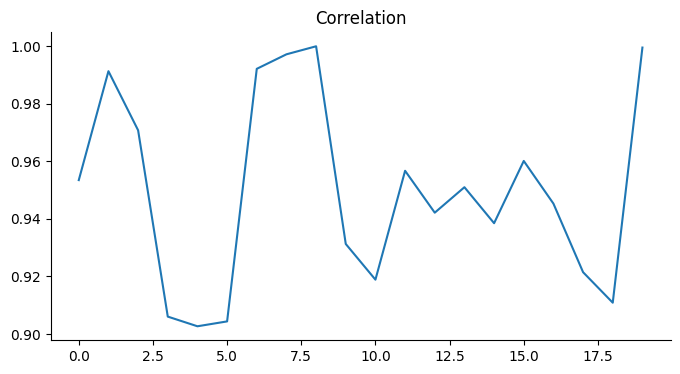

In [23]:
# @title Correlation

from matplotlib import pyplot as plt
corr_pairs_df['Correlation'].plot(kind='line', figsize=(8, 4), title='Correlation')
plt.gca().spines[['top', 'right']].set_visible(False)

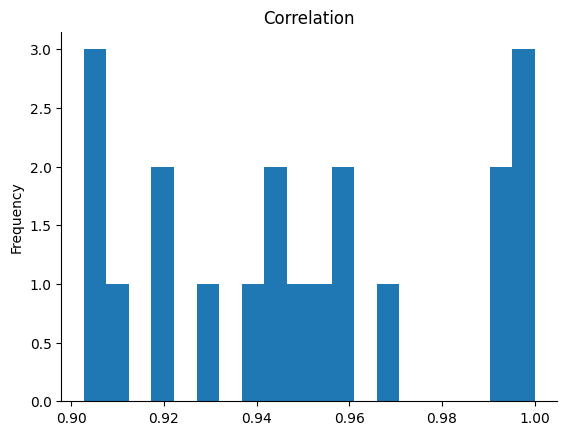

In [22]:
# @title Correlation

from matplotlib import pyplot as plt
corr_pairs_df['Correlation'].plot(kind='hist', bins=20, title='Correlation')
plt.gca().spines[['top', 'right',]].set_visible(False)

# **Next is to check for feature importance using Rf**

In [15]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import pandas as pd

# Defining the Features from the Target Variables
X = encoded.drop('Label', axis=1)  # Features
y = encoded['Label']  # Target variable
# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Check if y needs to be converted to a categorical type if it's not already
if y_train.dtype == 'int64' or y_train.dtype == 'float64':
    y_train = y_train.astype('int')  # Converting to int if it's not categorical
# Initialize the RandomForest classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)
# Train the model
rf.fit(X_train, y_train)
# Get feature importances
importances = rf.feature_importances_
# Create a DataFrame to view the feature importances
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
feature_importances = feature_importances.sort_values(by='Importance', ascending=True)
# Print the least important features
print("Least important features based on RandomForest:")
print(feature_importances.head(15))

Least important features based on RandomForest:
             Feature  Importance
39        ct_ftp_cmd    0.000005
38      is_ftp_login    0.000008
4              proto    0.000032
19              dwin    0.000035
37  ct_flw_http_mthd    0.000113
20             stcpb    0.000129
25       res_bdy_len    0.000207
24       trans_depth    0.000214
21             dtcpb    0.000395
35   is_sm_ips_ports    0.000489
11             sloss    0.000591
44  ct_src_dport_ltm    0.000664
29             Ltime    0.000667
43       ct_src_ ltm    0.000741
26              Sjit    0.000776


In [19]:
print("DataFrame columns:", encoded.columns.tolist())
print("Features to drop:", list(features_to_drop))


DataFrame columns: ['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes', 'dttl', 'service', 'Sload', 'Dload', 'Spkts', 'Dpkts', 'swin', 'stcpb', 'dtcpb', 'smeansz', 'dmeansz', 'trans_depth', 'res_bdy_len', 'Sjit', 'Djit', 'Stime', 'Sintpkt', 'Dintpkt', 'tcprtt', 'is_sm_ips_ports', 'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login', 'ct_ftp_cmd', 'ct_dst_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'attack_cat']
Features to drop: ['synack', 'dloss', 'ct_src_ ltm', 'sttl', 'sloss', 'Label', 'dbytes', 'dwin', 'Ltime', 'ackdat', 'ct_srv_dst', 'ct_src_dport_ltm', 'ct_srv_src']


In [30]:
merged_copy =merged_df.copy()

In [26]:
import pandas as pd

# Initialize a set to keep track of features to drop (sets avoid duplicates)
features_to_drop = set()
# Iterate through correlation pairs and determine which feature to drop
for index, row in corr_pairs_df.iterrows():
    feat1 = row['Feature 1'].strip()
    feat2 = row['Feature 2'].strip()
    # Obtain feature importances or handle cases where features are not found
    importance_feat1 = feature_importances.loc[feature_importances['Feature'] == feat1, 'Importance'].iloc[0] if feat1 in feature_importances['Feature'].values else -1
    importance_feat2 = feature_importances.loc[feature_importances['Feature'] == feat2, 'Importance'].iloc[0] if feat2 in feature_importances['Feature'].values else -1
    # Determine which feature to drop
    if importance_feat1 < importance_feat2:
        features_to_drop.add(feat1)
        print(f"Dropping {feat1} as it is less important than {feat2}")
    else:
        features_to_drop.add(feat2)
        print(f"Dropping {feat2} as it is less important than {feat1}")

# Drop the features from encoded
encoded.drop(columns=list(features_to_drop), inplace=True)

# Print remaining features
remaining_features = encoded.columns.tolist()
print("Remaining features:")
print(remaining_features)


Dropping sloss as it is less important than sbytes
Dropping dloss as it is less important than dbytes
Dropping dbytes as it is less important than Dpkts
Dropping sttl as it is less important than ct_state_ttl
Dropping sttl as it is less important than attack_cat
Dropping Label as it is less important than sttl
Dropping dloss as it is less important than Dpkts
Dropping dwin as it is less important than swin
Dropping Ltime as it is less important than Stime
Dropping synack as it is less important than tcprtt
Dropping ackdat as it is less important than tcprtt
Dropping ct_srv_src as it is less important than ct_srv_dst
Dropping ct_srv_src as it is less important than ct_dst_src_ltm
Dropping ct_srv_dst as it is less important than ct_dst_src_ltm
Dropping ct_src_ ltm as it is less important than ct_dst_ltm
Dropping ct_src_dport_ltm as it is less important than ct_dst_ltm
Dropping ct_src_dport_ltm as it is less important than ct_src_ ltm
Dropping ct_src_dport_ltm as it is less important than

KeyError: "['synack', 'dloss', 'ct_src_ ltm', 'sttl', 'sloss', 'Label', 'dbytes', 'dwin', 'Ltime', 'ackdat', 'ct_srv_dst', 'ct_src_dport_ltm', 'ct_srv_src'] not found in axis"

In [21]:
# Create a DataFrame to summarize the remaining features
summary_df = pd.DataFrame({
    'Feature': remaining_features,
    'Data Type': [encoded[feat].dtype for feat in remaining_features]
})

# Display the summary DataFrame
print(summary_df)


NameError: name 'remaining_features' is not defined

In [29]:
features_to_drop

{'Ltime',
 'ackdat',
 'ct_src_ ltm',
 'ct_src_dport_ltm',
 'ct_srv_dst',
 'ct_srv_src',
 'dbytes',
 'dloss',
 'dwin',
 'sloss',
 'sttl',
 'synack'}

In [28]:
least_impfeatures = features_to_drop.remove('Label')

In [30]:
import pandas as pd

# Load your raw DataFrame, assumed to be loaded as 'data'
data = pd.read_csv('/content/drive/My Drive/merged_dataset.csv')

# List of features to drop, ensure it's defined. Example:
# features_to_drop = ['feature1', 'feature2', ...]

# Drop the features from 'data'
data.drop(columns=features_to_drop, inplace=True)

# Confirm the features have been dropped
print("Remaining features after dropping less important ones:")
print(data.columns)

# # Optional: Save the reduced DataFrame if necessary
# data.to_csv('/content/drive/My Drive/cleaned_reduced_data.csv', index=False)

# Proceed with further cleaning and preprocessing
# This would typically include handling missing values, encoding categorical variables, scaling numerical features, etc.


<ipython-input-30-1899261b9ceb>:4: DtypeWarning: Columns (1,3,39,47) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('/content/drive/My Drive/merged_dataset.csv')  # Update this path as necessary


Remaining features after dropping less important ones:
Index(['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes',
       'dttl', 'service', 'Sload', 'Dload', 'Spkts', 'Dpkts', 'swin', 'stcpb',
       'dtcpb', 'smeansz', 'dmeansz', 'trans_depth', 'res_bdy_len', 'Sjit',
       'Djit', 'Stime', 'Sintpkt', 'Dintpkt', 'tcprtt', 'is_sm_ips_ports',
       'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login', 'ct_ftp_cmd',
       'ct_dst_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'attack_cat',
       'Label'],
      dtype='object')


# **Re- preprocessing of Reduced dataset**

In [31]:
data

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dttl,service,...,is_sm_ips_ports,ct_state_ttl,ct_flw_http_mthd,is_ftp_login,ct_ftp_cmd,ct_dst_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,Label
0,59.166.0.0,1390,149.171.126.6,53,udp,CON,0.001055,132,29,dns,...,0,0,0.0,0.0,0,1,1,1,NaN,0
1,59.166.0.0,33661,149.171.126.9,1024,udp,CON,0.036133,528,29,-,...,0,0,0.0,0.0,0,2,1,2,NaN,0
2,59.166.0.6,1464,149.171.126.7,53,udp,CON,0.001119,146,29,dns,...,0,0,0.0,0.0,0,1,1,1,NaN,0
3,59.166.0.5,3593,149.171.126.5,53,udp,CON,0.001209,132,29,dns,...,0,0,0.0,0.0,0,1,1,1,NaN,0
4,59.166.0.3,49664,149.171.126.0,53,udp,CON,0.001169,146,29,dns,...,0,0,0.0,0.0,0,1,1,1,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2540042,59.166.0.5,33094,149.171.126.7,43433,tcp,FIN,0.087306,320,29,ftp-data,...,0,0,NaN,NaN,,3,1,3,NaN,0
2540043,59.166.0.7,20848,149.171.126.4,21,tcp,CON,0.365058,456,29,ftp,...,0,0,NaN,2.0,2,2,2,2,NaN,0
2540044,59.166.0.3,21511,149.171.126.9,21,tcp,CON,6.335154,1802,29,ftp,...,0,0,NaN,2.0,2,4,2,2,NaN,0
2540045,59.166.0.9,35433,149.171.126.0,80,tcp,CON,2.200934,3498,29,http,...,0,0,2.0,NaN,,2,2,2,NaN,0


In [38]:
# Replace NaNs in 'attack_cat' column with 'normal'
data['attack_cat'].fillna('normal', inplace=True)

# Replace NaNs in 'ct_flw_http_mthd' and 'is_ftp_login' columns with '0'
data['ct_flw_http_mthd'].fillna(0, inplace=True)
data['is_ftp_login'].fillna(0, inplace=True)

# Handling replacements for 'dsport', 'service', and 'sport' as per the provided table
# Replacing special strings in 'dsport'
special_values_dsport = ['-', '0xc0a8', '0x20205321', '0xcc09']
for value in special_values_dsport:
    data['dsport'].replace(value, '53', inplace=True)

# Replacing special strings in 'service'
data['service'].replace('-', 'unknown', inplace=True)

# Replacing special strings in 'sport'
special_values_sport = ['-', '0x000b', '0x000c']
for value in special_values_sport:
    data['sport'].replace(value, '1043', inplace=True)
# Replace empty strings, None, or whitespace-only strings with 0
data['ct_ftp_cmd'] = data['ct_ftp_cmd'].apply(lambda x: 0 if pd.isna(x) or str(x).strip() == '' else x)
# Convert the 'dsport' column from string to numeric (integers)
data['dsport'] = pd.to_numeric(data['dsport'])
data['sport'] = pd.to_numeric(data['sport'])

In [39]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2540047 entries, 0 to 2540046
Data columns (total 37 columns):
 #   Column            Dtype  
---  ------            -----  
 0   srcip             object 
 1   sport             int64  
 2   dstip             object 
 3   dsport            int64  
 4   proto             object 
 5   state             object 
 6   dur               float64
 7   sbytes            int64  
 8   dttl              int64  
 9   service           object 
 10  Sload             float64
 11  Dload             float64
 12  Spkts             int64  
 13  Dpkts             int64  
 14  swin              int64  
 15  stcpb             int64  
 16  dtcpb             int64  
 17  smeansz           int64  
 18  dmeansz           int64  
 19  trans_depth       int64  
 20  res_bdy_len       int64  
 21  Sjit              float64
 22  Djit              float64
 23  Stime             int64  
 24  Sintpkt           float64
 25  Dintpkt           float64
 26  tcprtt        

In [40]:
# Select columns that are either object or category dtype
categorical_features = data.select_dtypes(include=['object', 'category']).columns.tolist()

# Print the categorical features
print("Categorical features in the DataFrame:")
print(categorical_features)

Categorical features in the DataFrame:
['srcip', 'dstip', 'proto', 'state', 'service', 'ct_ftp_cmd', 'attack_cat']


In [41]:
# Frequency encoding for IP addresses
freq_srcip = data['srcip'].value_counts(normalize=True)  # Frequency of each IP in 'srcip'
data['srcip'] = data['srcip'].map(freq_srcip)  # Map frequencies back to the DataFrame

freq_dstip = data['dstip'].value_counts(normalize=True)
data['dstip'] = data['dstip'].map(freq_dstip)


In [42]:
data

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dttl,service,...,is_sm_ips_ports,ct_state_ttl,ct_flw_http_mthd,is_ftp_login,ct_ftp_cmd,ct_dst_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,Label
0,0.077765,1390,0.074687,53,udp,CON,0.001055,132,29,dns,...,0,0,0.0,0.0,0,1,1,1,normal,0
1,0.077765,33661,0.074992,1024,udp,CON,0.036133,528,29,unknown,...,0,0,0.0,0.0,0,2,1,2,normal,0
2,0.074573,1464,0.074907,53,udp,CON,0.001119,146,29,dns,...,0,0,0.0,0.0,0,1,1,1,normal,0
3,0.077804,3593,0.077558,53,udp,CON,0.001209,132,29,dns,...,0,0,0.0,0.0,0,1,1,1,normal,0
4,0.077145,49664,0.077467,53,udp,CON,0.001169,146,29,dns,...,0,0,0.0,0.0,0,1,1,1,normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2540042,0.077804,33094,0.074907,43433,tcp,FIN,0.087306,320,29,ftp-data,...,0,0,0.0,0.0,0,3,1,3,normal,0
2540043,0.074431,20848,0.077809,21,tcp,CON,0.365058,456,29,ftp,...,0,0,0.0,2.0,2,2,2,2,normal,0
2540044,0.077145,21511,0.074992,21,tcp,CON,6.335154,1802,29,ftp,...,0,0,0.0,2.0,2,4,2,2,normal,0
2540045,0.074875,35433,0.077467,80,tcp,CON,2.200934,3498,29,http,...,0,0,2.0,0.0,0,2,2,2,normal,0


In [43]:
data['ct_ftp_cmd'].value_counts()

ct_ftp_cmd
0    2490642
1      22903
1      17174
0       5735
2       1234
4        804
3        729
6        332
5        290
4        156
2         30
8         18
Name: count, dtype: int64

In [44]:
import pandas as pd

# Assuming 'data' is your DataFrame and it has been loaded already
categorical_columns = ['proto', 'service', 'attack_cat', 'state', 'ct_ftp_cmd']  # list of categorical columns
data_encoded = pd.get_dummies(data, columns=categorical_columns)

print("Data after one-hot encoding:")
print(data_encoded.head())


Data after one-hot encoding:
      srcip  sport     dstip  dsport       dur  sbytes  dttl         Sload  \
0  0.077765   1390  0.074687      53  0.001055     132    29  500473.93750   
1  0.077765  33661  0.074992    1024  0.036133     528    29   87676.08594   
2  0.074573   1464  0.074907      53  0.001119     146    29  521894.53130   
3  0.077804   3593  0.077558      53  0.001209     132    29  436724.56250   
4  0.077145  49664  0.077467      53  0.001169     146    29  499572.25000   

          Dload  Spkts  ...  state_INT  state_MAS  state_PAR  state_REQ  \
0  621800.93750      2  ...      False      False      False      False   
1   50480.17188      4  ...      False      False      False      False   
2  636282.37500      2  ...      False      False      False      False   
3  542597.18750      2  ...      False      False      False      False   
4  609067.56250      2  ...      False      False      False      False   

   state_RST  state_TST  state_TXD  state_URH  stat

In [45]:
import pandas as pd

# Assuming 'data_encoded' is your DataFrame after applying pd.get_dummies()
# Convert all boolean columns to integers
for column in data_encoded.columns:
    if data_encoded[column].dtype == 'bool':
        data_encoded[column] = data_encoded[column].astype(int)

# Now print the head to confirm the change
print(data_encoded.head())


      srcip  sport     dstip  dsport       dur  sbytes  dttl         Sload  \
0  0.077765   1390  0.074687      53  0.001055     132    29  500473.93750   
1  0.077765  33661  0.074992    1024  0.036133     528    29   87676.08594   
2  0.074573   1464  0.074907      53  0.001119     146    29  521894.53130   
3  0.077804   3593  0.077558      53  0.001209     132    29  436724.56250   
4  0.077145  49664  0.077467      53  0.001169     146    29  499572.25000   

          Dload  Spkts  ...  state_INT  state_MAS  state_PAR  state_REQ  \
0  621800.93750      2  ...          0          0          0          0   
1   50480.17188      4  ...          0          0          0          0   
2  636282.37500      2  ...          0          0          0          0   
3  542597.18750      2  ...          0          0          0          0   
4  609067.56250      2  ...          0          0          0          0   

   state_RST  state_TST  state_TXD  state_URH  state_URN  state_no  
0          

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardizing the data: PCA works best with a normalized feature set.
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_encoded)

# PCA
pca = PCA(n_components=0.95)  # keep 95% of variance
data_reduced = pca.fit_transform(data_scaled)

print(f"Reduced dataset shape: {data_reduced.shape}")
print(f"Explained variance ratio: {pca.explained_variance_ratio_.sum()}")


In [ ]:
import pandas as pd
import numpy as np

# Calculate the correlation matrix
corr_matrix = data.corr().abs()

# Select upper triangle of correlation matrix
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find columns with correlation greater than a threshold (e.g., 0.90)
collinear_columns = [column for column in upper_tri.columns if any(upper_tri[column] > 0.90)]

# Remove these columns from the DataFrame
data.drop(collinear_columns, axis=1, inplace=True)

# Now proceed to feature selection


In [40]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Histograms for each numeric column
# merged_df.hist(bins=15, figsize=(15, 10), layout=(4, 4))
# plt.show()

# # KDE plots for density
# for column in merged_df.select_dtypes(include=['float64', 'int64']).columns:
#     sns.kdeplot(merged_df[column], fill=True)
#     plt.title(f'Distribution of {column}')
#     plt.show()

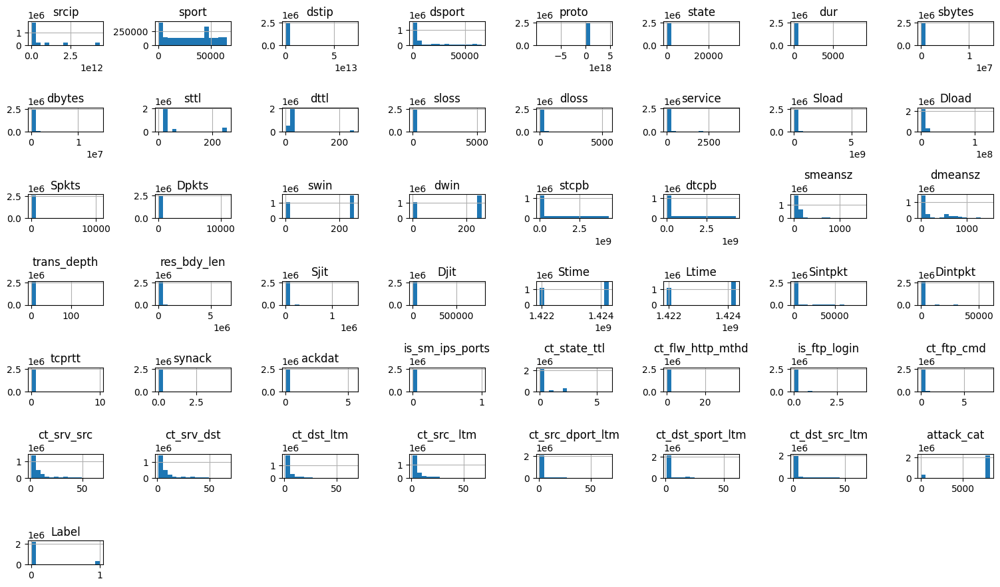

In [92]:
import matplotlib.pyplot as plt

# Calculate the number of numeric columns
num_cols = len(merged_df.select_dtypes(include=['float64', 'int64']).columns)

# Determine the size of the grid
grid_size = int(num_cols ** 0.5) + 1  # Take the square root of the number of columns and round up

# Histograms for each numeric column
merged_df.hist(bins=15, figsize=(15, 10), layout=(grid_size, grid_size))
plt.tight_layout()  # Adjust subplots to fit into figure area.
plt.show()


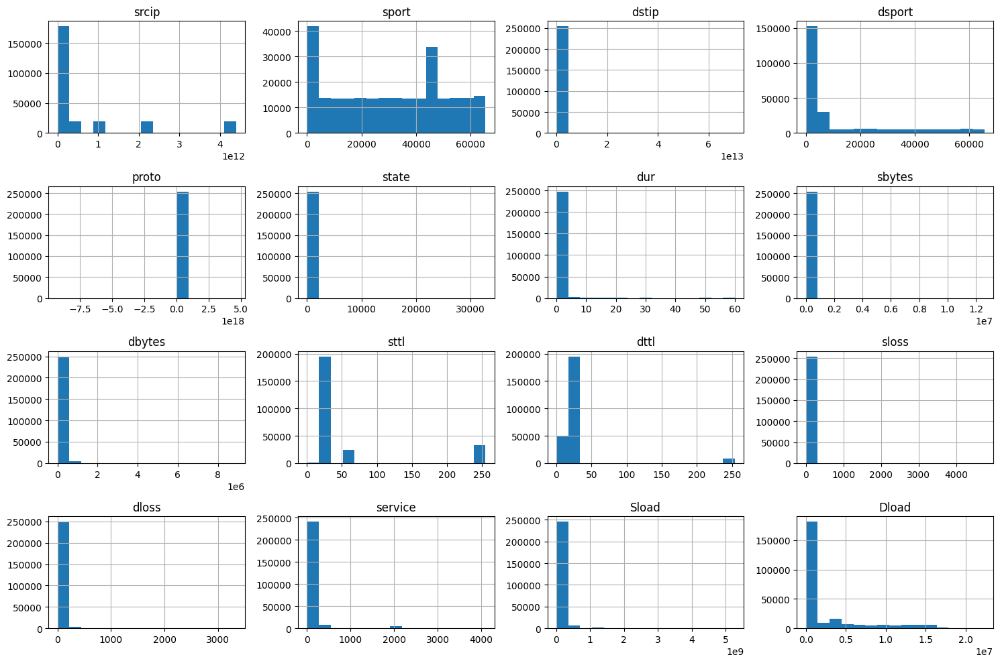

In [41]:
# Sample the data if it's too large
sampled_data = merged_df.sample(frac=0.1)  # Adjust fraction as needed based on dataset size

# Only select a subset of columns if there are too many
selected_columns = merged_df.columns[:16]  # Adjust number as needed
sampled_data[selected_columns].hist(bins=15, figsize=(15, 10), layout=(4, 4))
plt.tight_layout()
plt.show()


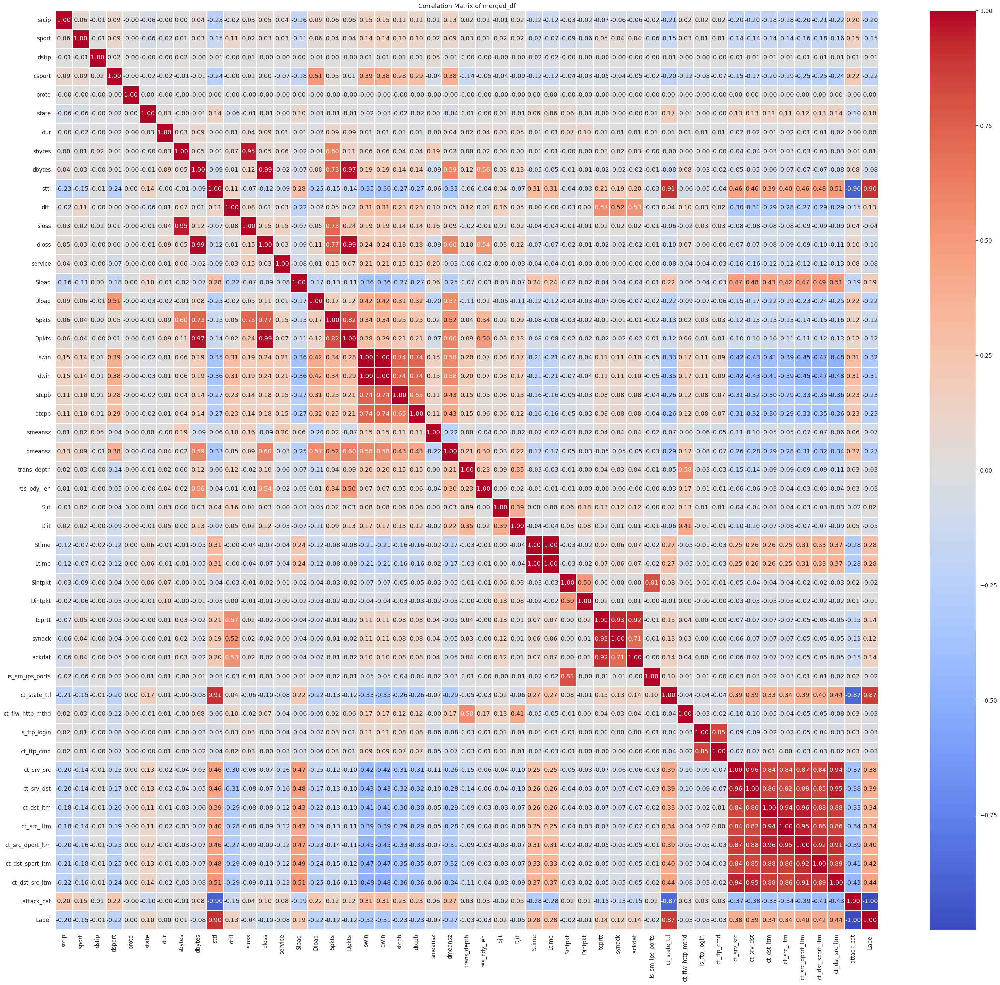

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corr_matrix = merged_df.corr()

# Plot the heatmap
plt.figure(figsize=(40, 36))
sns.set(font_scale=1.1)
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.9)
plt.title('Correlation Matrix of merged_df')
plt.show()


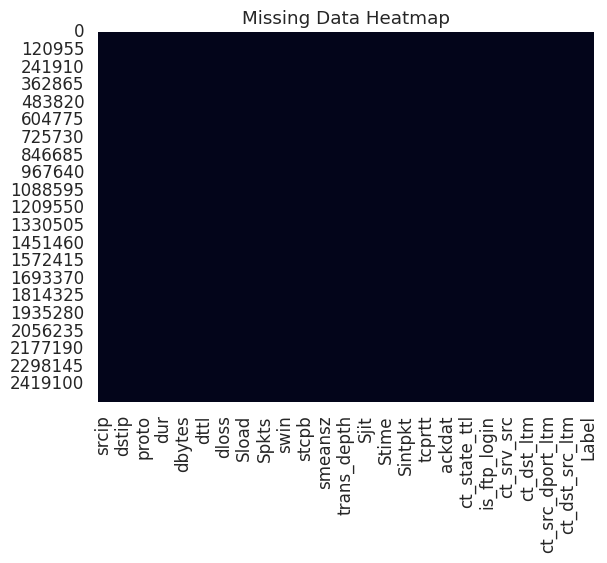

In [57]:
# Heatmap to show where missing values exist
sns.heatmap(merged_df.isnull(), cbar=False)
plt.title('Missing Data Heatmap')
plt.show()


In [58]:
# Pair plot of selected columns, optionally add hue for categorical columns
sns.pairplot(merged_df.sample(1000))  # Sample is used to speed up rendering
plt.show()


In [ ]:
# # Count plots for all categorical columns
# for column in merged_df.select_dtypes(include=['object']).columns:
#     sns.countplot(y=column, data=merged_df)
#     plt.title(f'Frequency of {column}')
#     plt.show()


In [44]:
# import pandas as pd

# # Attempt to convert 'ct_ftp_cmd' to numeric, coercing errors into NaNs
# merged_df['ct_ftp_cmd_numeric'] = pd.to_numeric(merged_df['ct_ftp_cmd'], errors='coerce')

# # Find rows where 'ct_ftp_cmd_numeric' is NaN to identify non-numeric values
# non_numeric_rows = merged_df[merged_df['ct_ftp_cmd_numeric'].isna()]

# # Display these non-numeric values
# print(non_numeric_rows['ct_ftp_cmd'].unique())


[]


In [84]:
# import pandas as pd

# # Attempt to convert 'dsport' to numeric, coercing errors into NaNs
# merged_df['dsport_numeric'] = pd.to_numeric(merged_df['dsport'], errors='coerce')

# # Find rows where 'dsport_numeric' is NaN to identify non-numeric values
# non_numeric_rows = merged_df[merged_df['dsport_numeric'].isna()]

# # Display these non-numeric values
# print(non_numeric_rows['dsport'].unique())


['53' '48879']


In [ ]:
# # Number of columns with NaN values
# columns_with_nan = merged_df.columns[merged_df.isnull().any()]
# num_columns_with_nan = len(columns_with_nan)

# # Number of rows with NaN values
# rows_with_nan = merged_df[merged_df.isnull().any(axis=1)]
# num_rows_with_nan = len(rows_with_nan)

# # Print the results
# print("Number of columns with NaN values:", num_columns_with_nan)
# print("Number of rows with NaN values:", num_rows_with_nan)


Number of columns with NaN values: 36
Number of rows with NaN values: 1


In [ ]:
# Remove rows with NaN values
merged_df.dropna(inplace=True)

# Reset index after dropping rows
merged_df.reset_index(drop=True, inplace=True)


In [ ]:
# Number of columns with NaN values
columns_with_nan = merged_df.columns[merged_df.isnull().any()]
num_columns_with_nan = len(columns_with_nan)

# Number of rows with NaN values
rows_with_nan = merged_df[merged_df.isnull().any(axis=1)]
num_rows_with_nan = len(rows_with_nan)

# Print the results
print("Number of columns with NaN values:", num_columns_with_nan)
print("Number of rows with NaN values:", num_rows_with_nan)

Number of columns with NaN values: 0
Number of rows with NaN values: 0


In [ ]:
merged_df['state'].unique()

array(['CON', 'INT', 'FIN', 'URH', 'REQ', 'ECO', 'RST', 'CLO', 'TXD',
       'URN', 'no', 'ACC', 'PAR', 'MAS'], dtype=object)

In [ ]:
# Replace '-' entries in the 'state' column with 'othrs'
merged_df['state'].replace('-', 'othrs', inplace=True)


In [ ]:
merged_df['proto'].unique()

array(['udp', 'arp', 'tcp', 'ospf', 'icmp', 'igmp', 'sctp', 'udt', 'sep',
       'sun-nd', 'swipe', 'mobile', 'pim', 'rtp', 'ipnip', 'ip', 'ggp',
       'st2', 'egp', 'cbt', 'emcon', 'nvp', 'igp', 'xnet', 'argus',
       'bbn-rcc', 'chaos', 'pup', 'hmp', 'mux', 'dcn', 'prm', 'trunk-1',
       'xns-idp', 'trunk-2', 'leaf-1', 'leaf-2', 'irtp', 'rdp', 'iso-tp4',
       'netblt', 'mfe-nsp', 'merit-inp', '3pc', 'xtp', 'idpr', 'tp++',
       'ddp', 'idpr-cmtp', 'ipv6', 'il', 'idrp', 'ipv6-frag', 'sdrp',
       'ipv6-route', 'gre', 'rsvp', 'mhrp', 'bna', 'esp', 'i-nlsp',
       'narp', 'ipv6-no', 'tlsp', 'skip', 'ipv6-opts', 'any', 'cftp',
       'sat-expak', 'kryptolan', 'rvd', 'ippc', 'sat-mon', 'ipcv', 'visa',
       'cpnx', 'cphb', 'wsn', 'pvp', 'br-sat-mon', 'wb-mon', 'wb-expak',
       'iso-ip', 'secure-vmtp', 'vmtp', 'vines', 'ttp', 'nsfnet-igp',
       'dgp', 'tcf', 'eigrp', 'sprite-rpc', 'larp', 'mtp', 'ax.25',
       'ipip', 'micp', 'aes-sp3-d', 'encap', 'etherip', 'pri-enc', 'gmtp'

In [ ]:
merged_df['state'].unique()

array(['CON', 'INT', 'FIN', 'URH', 'REQ', 'ECO', 'RST', 'CLO', 'TXD',
       'URN', 'no', 'ACC', 'PAR', 'MAS'], dtype=object)

In [ ]:
merged_df['service'].unique()

array(['dns', 'othrs', 'http', 'smtp', 'ftp-data', 'ftp', 'ssh', 'pop3',
       'snmp', 'ssl', 'irc', 'radius', 'dhcp'], dtype=object)

In [ ]:
# Replace '-' entries in the 'state' column with 'othrs'
merged_df['service'].replace('-', 'othrs', inplace=True)

In [ ]:
merged_df.shape

(92342, 50)

In [ ]:
# data.head()

In [ ]:
# data.info()

In [ ]:
# Checking the Unique value counts of categorical columns: srcip, dstip, dsport, state, proto, and service

# List of columns
columns_to_check = ['srcip', 'dstip', 'dsport', 'state', 'proto', 'service', 'attack_cat']

# Print count of unique variables for each column
for column in columns_to_check:
    unique_count = merged_df[column].nunique()
    print(f"Unique count of variables in '{column}': {unique_count}")


Unique count of variables in 'srcip': 39
Unique count of variables in 'dstip': 42
Unique count of variables in 'dsport': 20913
Unique count of variables in 'state': 14
Unique count of variables in 'proto': 135
Unique count of variables in 'service': 13
Unique count of variables in 'attack_cat': 10


In [ ]:
# Get the list of categorical columns
categorical_columns = merged_df_copy.select_dtypes(include=['object', 'category']).columns.tolist()

# Print the list of categorical columns
print("Categorical columns:", categorical_columns)


Categorical columns: ['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'service', 'attack_cat']


In [ ]:
merged_df_copy['state'].unique()

array(['CON', 'INT', 'FIN', 'URH', 'REQ', 'ECO', 'RST', 'CLO', 'TXD',
       'URN', 'no', 'ACC', 'PAR', 'MAS', 'TST'], dtype=object)

In [ ]:
# print(data['service'].unique())

In [ ]:
# Count the occurrences of each unique value in the 'attack_cat' column
attack_cat_counts = merged_df['attack_cat'].value_counts(dropna=False)

# Print the counts of each unique value
print("Counts of each unique value in the 'attack_cat' column:")
print(attack_cat_counts)

Counts of each unique value in the 'attack_cat' column:
attack_cat
normal            82277
Exploits           3207
 Fuzzers           3102
Generic             972
Reconnaissance      875
DoS                 821
Backdoors           492
Analysis            464
Shellcode           117
Worms                15
Name: count, dtype: int64


In [ ]:
# Filter columns with values starting with '0xc0a8'
columns_with_values = merged_df.columns[merged_df.astype(str).apply(lambda x: x.str.contains('^0xc0a8')).any()]

# Print the columns
print("Columns with values starting with '0xc0a8':")
print(columns_with_values)


Columns with values starting with '0xc0a8':
Index(['dsport'], dtype='object')


In [ ]:
# Count occurrences of '0xc0a8' in the 'dsport' column
count_0xc0a8 = (merged_df['dsport'] == '0xc0a8').sum()

# Find the rows where '0xc0a8' appears in the 'dsport' column
rows_with_0xc0a8 = merged_df[merged_df['dsport'] == '0xc0a8']

# Count the number of rows where '0xc0a8' appears
num_rows_with_0xc0a8 = len(rows_with_0xc0a8)

# Print the count of occurrences and the number of rows
print("Count of '0xc0a8' in the 'dsport' column:", count_0xc0a8)
print("Number of rows where '0xc0a8' appears in the 'dsport' column:", num_rows_with_0xc0a8)


Count of '0xc0a8' in the 'dsport' column: 54
Number of rows where '0xc0a8' appears in the 'dsport' column: 54


In [ ]:
# Remove rows where '0xc0a8' appears in the 'dsport' column
merged_df = merged_df[merged_df['dsport'] != '0xc0a8']


In [ ]:
# Create a copy of the DataFrame
merged_df_copy = merged_df.copy()


In [ ]:
# Drop the column named "Unnamed: 0"
merged_df_copy.drop(columns=['Unnamed: 0'], inplace=True)


In [ ]:
merged_df_copy

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,...,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,Label
0,59.166.0.0,1390,149.171.126.6,53,udp,CON,0.001055,132.0,164.0,31.0,...,0.0,3.0,7.0,1.0,3.0,1.0,1.0,1.0,normal,0.0
1,59.166.0.0,33661,149.171.126.9,1024,udp,CON,0.036133,528.0,304.0,31.0,...,0.0,2.0,4.0,2.0,3.0,1.0,1.0,2.0,normal,0.0
2,59.166.0.6,1464,149.171.126.7,53,udp,CON,0.001119,146.0,178.0,31.0,...,0.0,12.0,8.0,1.0,2.0,2.0,1.0,1.0,normal,0.0
3,59.166.0.5,3593,149.171.126.5,53,udp,CON,0.001209,132.0,164.0,31.0,...,0.0,6.0,9.0,1.0,1.0,1.0,1.0,1.0,normal,0.0
4,59.166.0.3,49664,149.171.126.0,53,udp,CON,0.001169,146.0,178.0,31.0,...,0.0,7.0,9.0,1.0,1.0,1.0,1.0,1.0,normal,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139525,59.166.0.0,52708,149.171.126.2,50651,tcp,FIN,0.020871,3390.0,41676.0,31.0,...,0.0,7.0,10.0,2.0,2.0,1.0,1.0,2.0,normal,0.0
139526,59.166.0.8,40084,149.171.126.4,22,tcp,FIN,0.126838,3728.0,5474.0,31.0,...,0.0,10.0,11.0,5.0,3.0,1.0,1.0,3.0,normal,0.0
139527,59.166.0.9,7663,149.171.126.8,22,tcp,FIN,0.094723,14512.0,17134.0,31.0,...,0.0,10.0,7.0,4.0,2.0,1.0,1.0,1.0,normal,0.0
139528,59.166.0.3,33662,149.171.126.0,31721,tcp,FIN,0.020988,3390.0,41676.0,31.0,...,0.0,10.0,9.0,1.0,6.0,1.0,1.0,1.0,normal,0.0


In [ ]:
X = merged_df_copy.iloc[:, 0:49].values
y = merged_df_copy.iloc[:, -1].values

In [ ]:
y[0:10]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [ ]:
X[:, 4:5]

array([['udp'],
       ['udp'],
       ['udp'],
       ...,
       ['tcp'],
       ['tcp'],
       ['tcp']], dtype=object)

In [ ]:
X[:, 5:6]

array([['CON'],
       ['CON'],
       ['CON'],
       ...,
       ['FIN'],
       ['FIN'],
       ['FIN']], dtype=object)

In [ ]:
X[:, 47:48]

array([['normal'],
       ['normal'],
       ['normal'],
       ...,
       ['normal'],
       ['normal'],
       ['normal']], dtype=object)

In [ ]:
merged_df_copy.to_csv('merged_cleaned1.csv')

In [ ]:
merged_df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 139476 entries, 0 to 139529
Data columns (total 49 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   srcip             139476 non-null  object 
 1   sport             139476 non-null  object 
 2   dstip             139476 non-null  object 
 3   dsport            139476 non-null  object 
 4   proto             139476 non-null  object 
 5   state             139476 non-null  object 
 6   dur               139476 non-null  float64
 7   sbytes            139476 non-null  float64
 8   dbytes            139476 non-null  float64
 9   sttl              139476 non-null  float64
 10  dttl              139476 non-null  float64
 11  sloss             139476 non-null  float64
 12  dloss             139476 non-null  float64
 13  service           139476 non-null  object 
 14  Sload             139476 non-null  float64
 15  Dload             139476 non-null  float64
 16  Spkts             139476 

In [ ]:
# from sklearn.preprocessing import OrdinalEncoder

# # Convert all values in the columns to strings
# X[:, 4:6] = X[:, 4:6].astype(str)

# # Initialize the OrdinalEncoder
# encoder = OrdinalEncoder()

# # Encode the "proto" column
# X[:, 4:5] = encoder.fit_transform(X[:, 4:5])

# # Encode the "state" column
# X[:, 5:6] = encoder.fit_transform(X[:, 5:6])


In [ ]:
merged_df_copy

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,...,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,Label
0,59.166.0.0,1390,149.171.126.6,53,udp,CON,0.001055,132.0,164.0,31.0,...,0.0,3.0,7.0,1.0,3.0,1.0,1.0,1.0,normal,0.0
1,59.166.0.0,33661,149.171.126.9,1024,udp,CON,0.036133,528.0,304.0,31.0,...,0.0,2.0,4.0,2.0,3.0,1.0,1.0,2.0,normal,0.0
2,59.166.0.6,1464,149.171.126.7,53,udp,CON,0.001119,146.0,178.0,31.0,...,0.0,12.0,8.0,1.0,2.0,2.0,1.0,1.0,normal,0.0
3,59.166.0.5,3593,149.171.126.5,53,udp,CON,0.001209,132.0,164.0,31.0,...,0.0,6.0,9.0,1.0,1.0,1.0,1.0,1.0,normal,0.0
4,59.166.0.3,49664,149.171.126.0,53,udp,CON,0.001169,146.0,178.0,31.0,...,0.0,7.0,9.0,1.0,1.0,1.0,1.0,1.0,normal,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139525,59.166.0.0,52708,149.171.126.2,50651,tcp,FIN,0.020871,3390.0,41676.0,31.0,...,0.0,7.0,10.0,2.0,2.0,1.0,1.0,2.0,normal,0.0
139526,59.166.0.8,40084,149.171.126.4,22,tcp,FIN,0.126838,3728.0,5474.0,31.0,...,0.0,10.0,11.0,5.0,3.0,1.0,1.0,3.0,normal,0.0
139527,59.166.0.9,7663,149.171.126.8,22,tcp,FIN,0.094723,14512.0,17134.0,31.0,...,0.0,10.0,7.0,4.0,2.0,1.0,1.0,1.0,normal,0.0
139528,59.166.0.3,33662,149.171.126.0,31721,tcp,FIN,0.020988,3390.0,41676.0,31.0,...,0.0,10.0,9.0,1.0,6.0,1.0,1.0,1.0,normal,0.0


In [ ]:
# Get the list of categorical columns
categorical_columns = merged_df_copy.select_dtypes(include=['object', 'category']).columns.tolist()

# Print the list of categorical columns
print("Categorical columns:", categorical_columns)


Categorical columns: ['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'service', 'attack_cat']


In [ ]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()

# Encode the "proto" column
merged_df_copy.loc[:, 'proto'] = np.array(encoder.fit_transform(merged_df_copy.loc[:, 'proto'].to_numpy().reshape(-1, 1))) # For Proto
merged_df_copy.loc[:, 'state'] = np.array(encoder.fit_transform(merged_df_copy.loc[:, 'state'].to_numpy().reshape(-1, 1))) # For State
merged_df_copy.loc[:, 'attack_cat'] = np.array(encoder.fit_transform(merged_df_copy.loc[:, 'attack_cat'].to_numpy().reshape(-1, 1))) # For Attack_Cat
merged_df_copy.loc[:, 'service'] = np.array(encoder.fit_transform(merged_df_copy.loc[:, 'service'].to_numpy().reshape(-1, 1))) # For service

In [ ]:
len(merged_df_copy)

139476

In [ ]:
X[:, 4:5]

array([[120.0],
       [120.0],
       [120.0],
       ...,
       [114.0],
       [114.0],
       [114.0]], dtype=object)

In [ ]:
X[:, 5:6]

array([[2.0],
       [2.0],
       [2.0],
       ...,
       [4.0],
       [4.0],
       [4.0]], dtype=object)

In [ ]:
X[:, 14:15]

array([[54040.0],
       [34189.0],
       [54726.0],
       ...,
       [74073.0],
       [74844.0],
       [14112.0]], dtype=object)

In [ ]:
X[:, 47]

array([9.0, 9.0, 9.0, ..., 9.0, 9.0, 9.0], dtype=object)

In [ ]:
# Find the index of the 'attack_cat' column
attack_cat_index = merged_df.columns.get_loc('service')
print(attack_cat_index)

14


In [ ]:
# Encode the "attack_cat" column
X[:, 47:48] = np.array(encoder.fit_transform(X[:, 47:48]))


In [ ]:
X[:, 47]

array([9.0, 9.0, 9.0, ..., 9.0, 9.0, 9.0], dtype=object)

In [ ]:
# # Count the number of NaN values in the 'attack_cat' column
# nan_count = np.sum(pd.isnull(X[:, 47]))

# # Print the count of NaN values
# print("Number of NaN values in the 'attack_cat' column:", nan_count)


In [ ]:
# from sklearn.preprocessing import OrdinalEncoder

# # List of columns to encode
# columns_to_encode = ['srcip', 'sport', 'dstip', 'proto', 'state', 'service', 'attack_cat']

# # Convert the columns to strings
# data[columns_to_encode] = data[columns_to_encode].astype(str)

# # Initialize the OrdinalEncoder
# encoder = OrdinalEncoder()

# # Fit-transform the encoder on the specified columns in 'data' DataFrame
# data[columns_to_encode] = encoder.fit_transform(data[columns_to_encode])

# # Display the encoded DataFrame
# print(data)


In [ ]:
# # Checking the Unique value counts of categorical columns: srcip, dstip, dsport, state, proto, and service

# # List of columns
# columns_to_check = ['srcip', 'dstip', 'dsport', 'state', 'proto', 'service']

# # Print count of unique variables for each column
# for column in columns_to_check:
#     unique_count = data[column].nunique()
#     print(f"Unique count of variables in '{column}': {unique_count}")

In [ ]:
# print(data['state'].unique())

In [ ]:
# print(data['proto'].unique())

In [ ]:
# print(data['attack_cat'].unique())

In [ ]:
# from sklearn.compose import ColumnTransformer
# from sklearn.preprocessing import OneHotEncoder

# # Define the ColumnTransformer
# ct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), [0, 1])], remainder='passthrough')

# # Apply the transformation to X
# # X = np.array(ct.fit_transform(X))
# merged_df_copy.loc[:, ('srcip', 'dstip')] = np.array(ct.fit_transform(merged_df_copy.loc[:, ('srcip', 'dstip')]))

In [ ]:
# from sklearn.compose import ColumnTransformer
# from sklearn.preprocessing import OneHotEncoder

# # Define the ColumnTransformer
# ct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(), ['srcip', 'dstip'])], remainder='passthrough')

# # Apply the transformation to the specified columns
# merged_df_copy_encoded = pd.DataFrame(ct.fit_transform(merged_df_copy), columns=ct.get_feature_names_out(['srcip', 'dstip']) + list(merged_df_copy.columns[2:]))

# # Display the encoded DataFrame
# print(merged_df_copy_encoded)


In [ ]:
# from sklearn.preprocessing import OneHotEncoder

# # Initialize OneHotEncoder
# encoder = OneHotEncoder()

# # Encode the specified columns
# encoded_columns = encoder.fit_transform(merged_df_copy[['srcip', 'dstip']])

In [ ]:
# encoded_columns[0]

<1x81 sparse matrix of type '<class 'numpy.float64'>'
	with 2 stored elements in Compressed Sparse Row format>

In [ ]:
# # Replace the original columns with the encoded values
# merged_df_copy[['srcip', 'dstip']] = encoded_columns.toarray()

# # Display the updated DataFrame
# print(merged_df_copy)

In [ ]:
# from sklearn.preprocessing import OneHotEncoder

# # Initialize OneHotEncoder
# encoder = OneHotEncoder()

# # Encode the specified columns
# encoded_columns = encoder.fit_transform(merged_df_copy[['srcip', 'dstip']])

# # Convert the encoded values to a DataFrame
# encoded_df = pd.DataFrame(encoded_columns.toarray(), columns=encoder.get_feature_names_out(['srcip', 'dstip']))

# # Replace the original columns with the encoded values
# merged_df_copy.drop(columns=['srcip', 'dstip'], inplace=True)
# merged_df_copy = pd.concat([merged_df_copy, encoded_df], axis=1)

# # Display the updated DataFrame
# print(merged_df_copy)

In [ ]:
from sklearn.preprocessing import OneHotEncoder

# Initialize OneHotEncoder
encoder = OneHotEncoder()

# Encode the specified columns
encoded_columns = encoder.fit_transform(merged_df_copy[['srcip', 'dstip']])

# Get the encoded column names
encoded_column_names = encoder.get_feature_names_out(['srcip', 'dstip'])

# Convert the encoded values to a DataFrame
encoded_df = pd.DataFrame(encoded_columns.toarray(), columns=encoded_column_names)

# Replace the original 'srcip' column with the corresponding encoded values
merged_df_copy['srcip'] = encoded_df.iloc[:, :len(encoder.categories_[0])]

# Replace the original 'dstip' column with the corresponding encoded values
merged_df_copy['dstip'] = encoded_df.iloc[:, len(encoder.categories_[0]):]

# Display the updated DataFrame
print(merged_df_copy)


ValueError: Columns must be same length as key

In [ ]:
len(merged_df_copy.columns)

128

In [ ]:
merged_df_copy

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,...,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,Label
0,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",1390,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",53,udp,CON,0.001055,132.0,164.0,31.0,...,0.0,3.0,7.0,1.0,3.0,1.0,1.0,1.0,normal,0.0
1,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",33661,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",1024,udp,CON,0.036133,528.0,304.0,31.0,...,0.0,2.0,4.0,2.0,3.0,1.0,1.0,2.0,normal,0.0
2,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",1464,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",53,udp,CON,0.001119,146.0,178.0,31.0,...,0.0,12.0,8.0,1.0,2.0,2.0,1.0,1.0,normal,0.0
3,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",3593,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",53,udp,CON,0.001209,132.0,164.0,31.0,...,0.0,6.0,9.0,1.0,1.0,1.0,1.0,1.0,normal,0.0
4,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",49664,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",53,udp,CON,0.001169,146.0,178.0,31.0,...,0.0,7.0,9.0,1.0,1.0,1.0,1.0,1.0,normal,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139525,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",52708,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",50651,tcp,FIN,0.020871,3390.0,41676.0,31.0,...,0.0,7.0,10.0,2.0,2.0,1.0,1.0,2.0,normal,0.0
139526,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",40084,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",22,tcp,FIN,0.126838,3728.0,5474.0,31.0,...,0.0,10.0,11.0,5.0,3.0,1.0,1.0,3.0,normal,0.0
139527,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",7663,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",22,tcp,FIN,0.094723,14512.0,17134.0,31.0,...,0.0,10.0,7.0,4.0,2.0,1.0,1.0,1.0,normal,0.0
139528,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",33662,"(0, 29)\t1.0\n (0, 59)\t1.0\n (1, 29)\t1.0...",31721,tcp,FIN,0.020988,3390.0,41676.0,31.0,...,0.0,10.0,9.0,1.0,6.0,1.0,1.0,1.0,normal,0.0


In [ ]:
merged_df_copy.columns

Index(['srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes',
       'dbytes', 'sttl', 'dttl', 'sloss', 'dloss', 'service', 'Sload', 'Dload',
       'Spkts', 'Dpkts', 'swin', 'dwin', 'stcpb', 'dtcpb', 'smeansz',
       'dmeansz', 'trans_depth', 'res_bdy_len', 'Sjit', 'Djit', 'Stime',
       'Ltime', 'Sintpkt', 'Dintpkt', 'tcprtt', 'synack', 'ackdat',
       'is_sm_ips_ports', 'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login',
       'ct_ftp_cmd', 'ct_srv_src', 'ct_srv_dst', 'ct_dst_ltm', 'ct_src_ ltm',
       'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'attack_cat',
       'Label'],
      dtype='object')

In [ ]:
type(merged_df_copy.loc[:, ['srcip', 'dstip']])

pandas.core.frame.DataFrame

In [ ]:
X[:, 0]

array([0.0, 0.0, 0.0, ..., 0.0, 0.0, 0.0], dtype=object)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, random_state=1)

In [ ]:
X

array([[0.0, 0.0, 0.0, ..., 1.0, 9.0, 0.0],
       [0.0, 0.0, 0.0, ..., 2.0, 9.0, 0.0],
       [0.0, 0.0, 0.0, ..., 1.0, 9.0, 0.0],
       ...,
       [0.0, 0.0, 0.0, ..., 1.0, 9.0, 0.0],
       [0.0, 0.0, 0.0, ..., 1.0, 9.0, 0.0],
       [0.0, 0.0, 0.0, ..., nan, 9.0, nan]], dtype=object)

In [ ]:
y

array([ 0.,  0.,  0., ...,  0.,  0., nan])

In [ ]:
X.shape

(139476, 128)

In [ ]:
y.shape

(139476,)

In [ ]:
X_frame = np.concatenate((X, y), axis=0)

ValueError: all the input arrays must have same number of dimensions, but the array at index 0 has 2 dimension(s) and the array at index 1 has 1 dimension(s)

In [ ]:
# Assuming X is a 2D array and y is a 1D array
# Reshape y to a column vector to match the number of rows in X
y_column_vector = y.reshape(-1, 1)

# Concatenate X and y_column_vector along axis 1 (columns)
X_frame = np.concatenate((X, y_column_vector), axis=1)


In [ ]:
len(X.shape)

2

In [ ]:
import pandas as pd

# Assuming X_frame is a NumPy array and column_names is a list of column names
df = pd.DataFrame(X_frame, columns=[
    'srcip', 'sport', 'dstip', 'dsport', 'proto', 'state', 'dur', 'sbytes', 'dbytes',
    'sttl', 'dttl', 'sloss', 'dloss', 'service', 'Sload', 'Dload', 'Spkts', 'Dpkts',
    'swin', 'dwin', 'stcpb', 'dtcpb', 'smeansz', 'dmeansz', 'trans_depth', 'res_bdy_len',
    'Sjit', 'Djit', 'Stime', 'Ltime', 'Sintpkt', 'Dintpkt', 'tcprtt', 'synack', 'ackdat',
    'is_sm_ips_ports', 'ct_state_ttl', 'ct_flw_http_mthd', 'is_ftp_login', 'ct_ftp_cmd',
    'ct_srv_src', 'ct_srv_dst', 'ct_dst_ltm', 'ct_src_ ltm', 'ct_src_dport_ltm',
    'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'attack_cat', 'Label'
])


ValueError: Shape of passed values is (139476, 129), indices imply (139476, 49)

In [ ]:
import pandas as pd

# Assuming X_frame is a NumPy array
df = pd.DataFrame(X_frame)

# You might also want to set column names for the DataFrame
# Assuming column_names is a list of column names for X_frame
df.columns = column_names


NameError: name 'column_names' is not defined

In [ ]:
X_frame.columns

RangeIndex(start=0, stop=128, step=1)

In [ ]:
merged_x_y = pd.DataFrame({
    'X': X,
    'y': y,}, columns=[X.columns])

ValueError: all the input arrays must have same number of dimensions, but the array at index 0 has 2 dimension(s) and the array at index 1 has 1 dimension(s)

In [ ]:
merged_x_y

array([0.0, 0.0, 0.0, ..., 0.0, 0.0, nan], dtype=object)

In [ ]:
# Assuming 'data' is your DataFrame containing the 'attack_cat' column

# Get the summary count of each unique value in the 'attack_cat' column
attack_cat_counts = data['attack_cat'].value_counts()

# Print the summary count
print("Summary count of each unique value in the 'attack_cat' column:")
print(attack_cat_counts)


In [ ]:
len(data.columns)

In [ ]:
# Iterate through each column in the DataFrame
for column in data.columns:
    # Check if the data type of the column is 'object'
    if data[column].dtype == 'object':
        print(f"Column '{column}' contains uncoded categorical data.")


In [ ]:
# Assuming 'data' is your DataFrame containing the 'dsport column

# Get the summary count of each unique value in the 'dsport' column
desport_counts = data['dsport'].value_counts()

# Print the summary count
print("Summary count of each unique value in the 'dsport' column:")
print(desport_counts)

In [ ]:
# Check the data type of the 'dsport' column
print("Data type of 'dsport' column:", data['dsport'].dtype)


In [ ]:
# Check the data types of all columns in the DataFrame
print("Data types of all columns:")
print(data.info())


In [ ]:
# Convert 'dsport' column to numeric data type
data['dsport'] = pd.to_numeric(data['dsport'], errors='coerce')

# Check the data type of the 'dsport' column after conversion
print("Data type of 'dsport' column after conversion:", data['dsport'].dtype)


In [ ]:
# Iterate through each column in the DataFrame
for column in data.columns:
    # Check if the data type of the column is 'object'
    if data[column].dtype == 'object':
        print(f"Column '{column}' contains uncoded categorical data.")


In [ ]:
# double checking for columns or possibilities of the presence of NaN or blank/empty cells

# Iterate through each column in the DataFrame
for column in data.columns:
    # Check for NaN values in the column
    if data[column].isnull().any():
        print(f"Column '{column}' contains NaN values.")

    # Check for empty cells (blanks) in the column
    if (data[column] == '').any():
        print(f"Column '{column}' contains empty cells.")


In [ ]:
# Find the indices of NaN values in the 'dsport' column
nan_indices = data[data['dsport'].isnull()].index

# Count the occurrences of NaN values in the 'dsport' column
nan_count = data['dsport'].isnull().sum()

# Print the location and count of NaN values
print("Indices of NaN values in the 'dsport' column:", nan_indices)



In [ ]:
print("Number of NaN values in the 'dsport' column:", nan_count)

In [ ]:
# Drop rows where 'dsport' column contains NaN values
data.dropna(subset=['dsport'], inplace=True)


In [ ]:
# Find the indices of NaN values in the 'dsport' column
nan_indices = data[data['dsport'].isnull()].index

# Count the occurrences of NaN values in the 'dsport' column
nan_count = data['dsport'].isnull().sum()

# Print the location and count of NaN values
print("Indices of NaN values in the 'dsport' column:", nan_indices)



In [ ]:
print("Number of NaN values in the 'dsport' column:", nan_count)

In [ ]:
print(data.head)

In [ ]:
# Check for NaN values in the entire DataFrame
nan_rows = data.isnull().any(axis=1)

# Count the number of rows with NaN values
nan_count_total = nan_rows.sum()

# Print the count of rows with NaN values
print("Number of rows with NaN values:", nan_count_total)


In [ ]:
len((data.columns))

In [ ]:
import pandas as pd
import numpy as np

# Create a sample DataFrame
np.random.seed(0)  # for reproducibility
data = {
    'ab': np.random.rand(100),
    'ac': np.random.choice(['A', 'B', 'C'], size=100),
    'ad': np.random.rand(100),
    'ae': np.random.rand(100),
    'af': np.random.rand(100),
    'au': np.random.choice(['X', 'Y', 'Z'], size=100)
}
df = pd.DataFrame(data)

# Display the sample DataFrame
print(df.head())


         ab ac        ad        ae        af au
0  0.548814  B  0.489549  0.787542  0.580197  Z
1  0.715189  C  0.338985  0.606475  0.716244  Y
2  0.602763  C  0.179490  0.218403  0.027069  Z
3  0.544883  C  0.170987  0.455169  0.731397  Y
4  0.423655  B  0.463451  0.878870  0.766964  Z


In [ ]:
df['ac'].unique()

array(['B', 'C', 'A'], dtype=object)